## Create Initial states

In [1]:
import numpy as np
from pathlib import Path
# Data processing
from pickle import load,dump

import os

import matplotlib.pyplot as plt 
import pandas as pd
# Custom modules
from src.particle_filter import ParticleFilter
from src.gmp import GammaMixtureProcess
from src.deg_models import DistModel,CombinedGammaLoss, fit
from src.helpers.data_processing import interpolate
from src.helpers.math import gamma_stats2params as stats2params

import torch

/home/abeldg/code/repo/research/dl-system-level-rul/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data_name = "DS03"

experiment_dir = Path('experiments')/data_name
states_dir = experiment_dir/'states'
os.makedirs(states_dir, exist_ok=True)

## Import training data


In [3]:
hi_train = pd.read_csv(experiment_dir/'hidata_dev.csv')
perform_alias = [col for col in hi_train.columns if col not in ['unit','cycle']]
units = hi_train['unit'].unique().tolist()

In [4]:
performs_train = {alias: 
    {int(unit): hi_train[hi_train['unit']==unit][alias].values for unit in units} 
    for alias in perform_alias
}
time_train = {int(unit): hi_train[hi_train['unit']==unit]['cycle'].values for unit in units}

## Create Initial Particles (Training)
The number of (pure) particles $N$ is the the number of training trajectories.

In [ ]:
from skorch import NeuralNetRegressor

def fit_with_skorch(
    s_train,
    t_train,
    max_s,
    criterion,
    lr=1,
    max_epochs=1000,
):
    net = NeuralNetRegressor(
        module=DistModel,
        module__max_s=max_s,
        criterion=criterion,
        optimizer=torch.optim.Adam,
        lr=lr,
        max_epochs=max_epochs,
        batch_size=-1,
        train_split=None,
        verbose=1,
    )

    # Skorch expects 2D X
    X = s_train.reshape(-1, 1).astype(np.float32)
    y = t_train.astype(np.float32)

    net.fit(X, y)
    return net.module_

### Create initial states

  epoch    train_loss     dur
-------  ------------  ------
      1      384.2732  0.0375
      2      342.6015  0.0018
      3      321.5191  0.0016
      4      308.6001  0.0016
      5      297.3203  0.0015
      6      285.5998  0.0015
      7      273.2487  0.0015
      8      260.6414  0.0015
      9      248.2652  0.0015
     10      236.5571  0.0015
     11      225.8429  0.0015
     12      216.3183  0.0015
     13      208.0479  0.0015
     14      200.9800  0.0015
     15      194.9674  0.0015
     16      189.7986  0.0015
     17      185.2339  0.0015
     18      181.0474  0.0015
     19      177.0584  0.0015
     20      173.1551  0.0015
     21      169.2971  0.0015
     22      165.5047  0.0015
     23      161.8403  0.0015
     24      158.3822  0.0015
     25      155.2051  0.0015
     26      152.3627  0.0015
     27      149.8784  0.0015
     28      147.7437  0.0015
     29      145.9211  0.0015
     30      144.3549  0.0015
     31      142.9808  0.0015
     32   

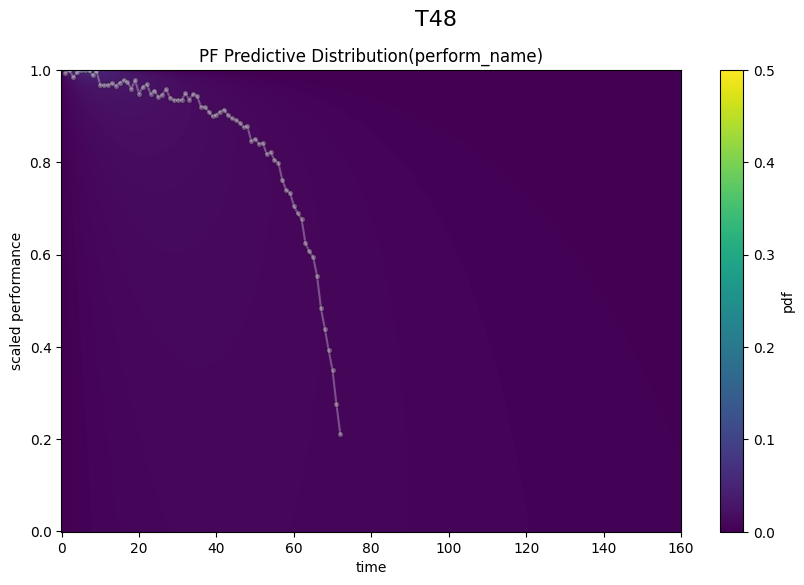

  epoch    train_loss     dur
-------  ------------  ------
      1      127.6258  0.0022
      2      105.2964  0.0020
      3       97.7976  0.0019
      4       87.0006  0.0017
      5       74.0835  0.0019
      6       63.9793  0.0017
      7       54.7143  0.0016
      8       46.7266  0.0019
      9       39.9199  0.0018
     10       34.3323  0.0018
     11       29.7621  0.0018
     12       25.9987  0.0018
     13       23.0339  0.0019
     14       21.3529  0.0018
     15       21.8056  0.0019
     16       24.6924  0.0018
     17       27.5259  0.0019
     18       26.9235  0.0018
     19       24.2291  0.0018
     20       22.3388  0.0018
     21       21.0828  0.0018
     22       18.3183  0.0018
     23       14.4311  0.0018
     24       11.6545  0.0018
     25       10.9399  0.0018
     26       11.1113  0.0019
     27       10.7311  0.0019
     28        9.7240  0.0019
     29        9.0400  0.0018
     30        9.3512  0.0018
     31        9.8206  0.0019
     32   

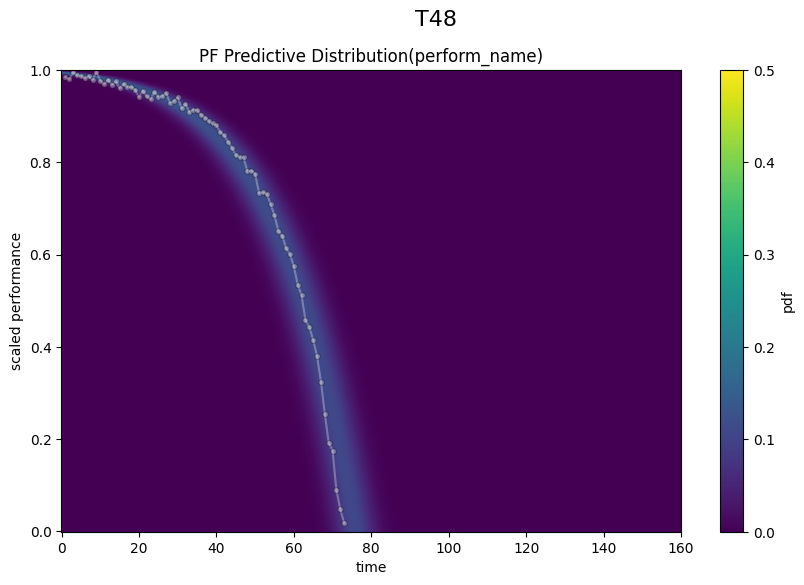

  epoch    train_loss     dur
-------  ------------  ------
      1      239.8260  0.0039
      2      213.6340  0.0018
      3      158.4870  0.0018
      4      145.8255  0.0017
      5      125.6236  0.0018
      6      102.2697  0.0018
      7       84.1458  0.0018
      8       67.6817  0.0018
      9       53.3376  0.0018
     10       41.5692  0.0018
     11       32.4576  0.0018
     12       25.8644  0.0018
     13       21.4215  0.0018
     14       18.8429  0.0018
     15       18.3005  0.0019
     16       20.3863  0.0018
     17       25.1963  0.0018
     18       30.8194  0.0019
     19       33.9501  0.0019
     20       33.4429  0.0019
     21       30.8857  0.0019
     22       28.1956  0.0018
     23       26.1584  0.0019
     24       24.5876  0.0018
     25       23.0630  0.0019
     26       21.4035  0.0018
     27       19.7348  0.0017
     28       18.3453  0.0018
     29       17.4937  0.0017
     30       17.2659  0.0018
     31       17.5173  0.0019
     32   

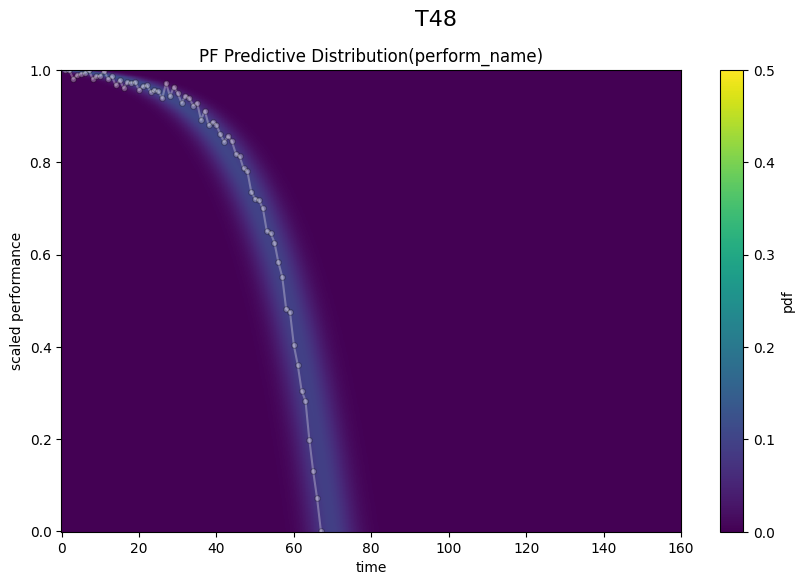

  epoch    train_loss     dur
-------  ------------  ------
      1      171.1599  0.0021
      2      149.6198  0.0015
      3      138.5007  0.0015
      4      120.8661  0.0015
      5      103.9138  0.0014
      6       87.8112  0.0015
      7       73.4153  0.0015
      8       59.8624  0.0015
      9       47.5085  0.0015
     10       36.8339  0.0015
     11       27.9922  0.0015
     12       20.8078  0.0015
     13       15.0397  0.0015
     14       10.9010  0.0015
     15        9.2948  0.0015
     16       11.5280  0.0015
     17       17.3867  0.0015
     18       21.6125  0.0015
     19       21.0212  0.0016
     20       19.0920  0.0016
     21       18.9211  0.0015
     22       20.0246  0.0015
     23       20.3456  0.0015
     24       18.8787  0.0015
     25       16.1790  0.0015
     26       13.4863  0.0015
     27       11.7929  0.0015
     28       11.3756  0.0015
     29       11.8337  0.0015
     30       12.4695  0.0015
     31       12.7239  0.0015
     32   

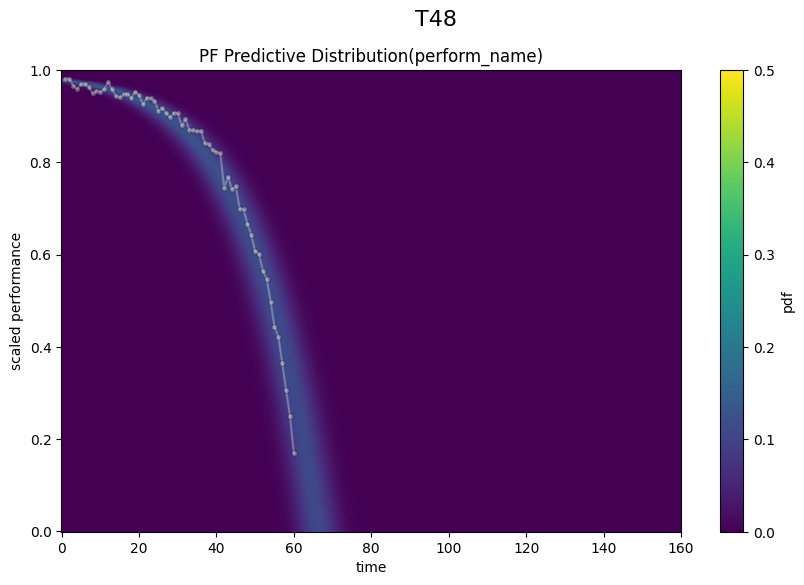

  epoch    train_loss     dur
-------  ------------  ------
      1      113.8848  0.0023
      2       87.0400  0.0020
      3       85.5646  0.0019
      4       92.6605  0.0019
      5       96.1438  0.0018
      6       94.0470  0.0018
      7       89.1919  0.0019
      8       84.8457  0.0020
      9       83.1795  0.0019
     10       84.4588  0.0019
     11       86.8830  0.0019
     12       88.0196  0.0019
     13       86.9401  0.0019
     14       84.6052  0.0019
     15       82.6034  0.0018
     16       81.9153  0.0025
     17       82.4652  0.0019
     18       83.4236  0.0019
     19       83.8926  0.0019
     20       83.4675  0.0019
     21       82.3770  0.0018
     22       81.2455  0.0018
     23       80.6731  0.0018
     24       80.8389  0.0018
     25       81.3646  0.0018
     26       81.6196  0.0019
     27       81.2756  0.0019
     28       80.5602  0.0019
     29       79.9789  0.0019
     30       79.8443  0.0019
     31       80.0594  0.0019
     32   

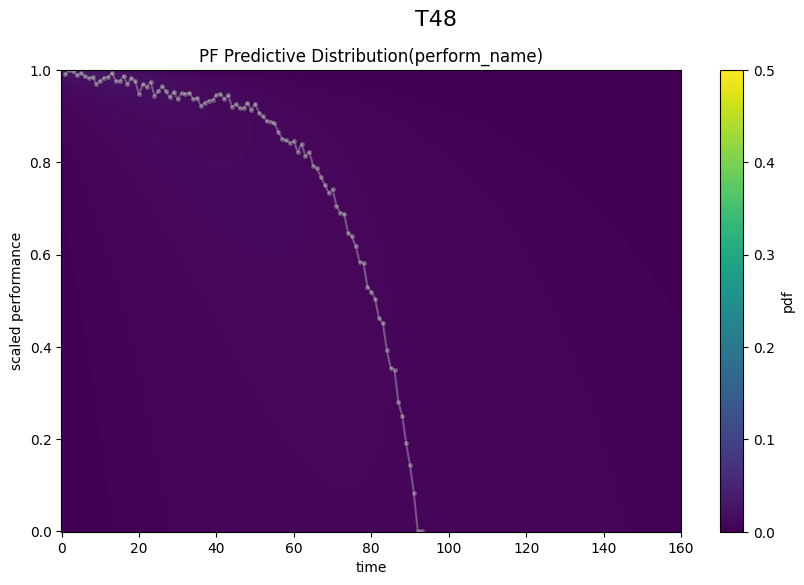

  epoch    train_loss     dur
-------  ------------  ------
      1      194.5548  0.0021
      2      165.0298  0.0014
      3      150.4458  0.0016
      4      133.4516  0.0016
      5      112.3734  0.0016
      6       94.5454  0.0016
      7       78.0464  0.0016
      8       63.1481  0.0016
      9       50.1347  0.0015
     10       38.8658  0.0016
     11       29.3884  0.0015
     12       21.6476  0.0016
     13       15.4765  0.0016
     14       10.9578  0.0016
     15        8.9622  0.0015
     16       10.7528  0.0014
     17       15.5414  0.0015
     18       18.7350  0.0015
     19       18.7924  0.0015
     20       18.7762  0.0015
     21       20.4724  0.0015
     22       22.3974  0.0015
     23       22.3865  0.0016
     24       20.2325  0.0016
     25       17.3427  0.0015
     26       15.1208  0.0015
     27       13.9295  0.0015
     28       13.2227  0.0015
     29       12.4225  0.0015
     30       11.4618  0.0016
     31       10.6115  0.0016
     32   

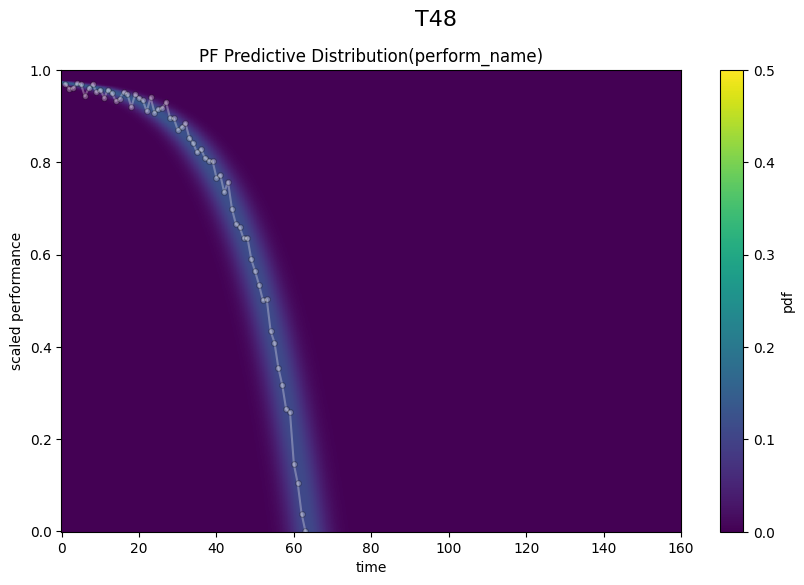

  epoch    train_loss     dur
-------  ------------  ------
      1       95.0420  0.0023
      2       87.9988  0.0019
      3       73.1805  0.0019
      4       65.6993  0.0018
      5       58.4520  0.0018
      6       52.4965  0.0017
      7       47.9496  0.0017
      8       43.1464  0.0017
      9       39.1964  0.0017
     10       35.8656  0.0017
     11       32.7659  0.0017
     12       29.6899  0.0017
     13       26.7452  0.0017
     14       24.0668  0.0017
     15       21.8924  0.0018
     16       20.7382  0.0017
     17       20.7212  0.0017
     18       20.0478  0.0016
     19       17.7124  0.0017
     20       16.1193  0.0017
     21       15.0860  0.0017
     22       12.2518  0.0018
     23       10.3306  0.0017
     24       10.2982  0.0018
     25        9.7480  0.0016
     26        9.4626  0.0017
     27       10.6114  0.0018
     28       11.2244  0.0017
     29       11.0742  0.0017
     30       11.4976  0.0017
     31       11.3874  0.0017
     32   

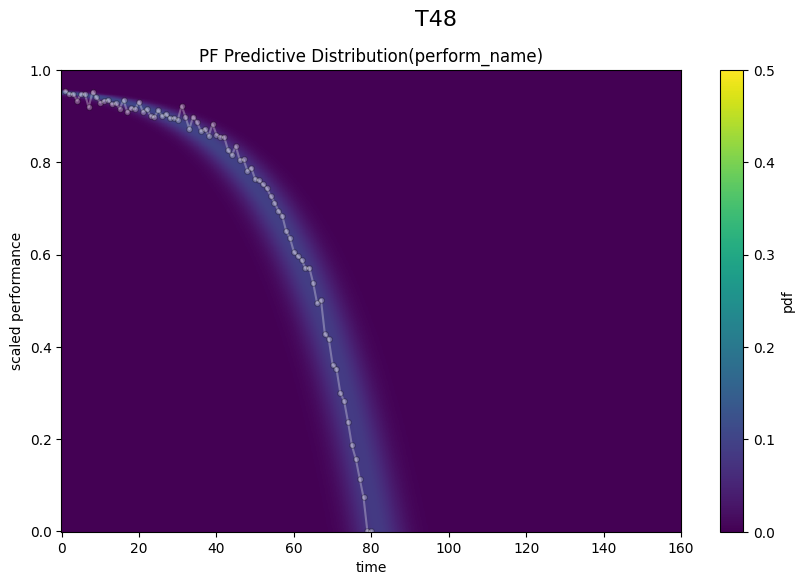

  epoch    train_loss     dur
-------  ------------  ------
      1      133.2824  0.0023
      2      121.8102  0.0015
      3      118.3749  0.0014
      4      110.0023  0.0015
      5      102.0141  0.0015
      6       95.8775  0.0016
      7       91.0571  0.0015
      8       86.8726  0.0015
      9       83.0955  0.0015
     10       79.8324  0.0015
     11       77.2586  0.0015
     12       75.4388  0.0015
     13       74.2714  0.0015
     14       73.5388  0.0015
     15       73.0064  0.0015
     16       72.5151  0.0015
     17       72.0161  0.0015
     18       71.5478  0.0015
     19       71.1811  0.0015
     20       70.9714  0.0015
     21       70.9293  0.0015
     22       71.0199  0.0016
     23       71.1806  0.0015
     24       71.3470  0.0015
     25       71.4741  0.0016
     26       71.5483  0.0015
     27       71.5816  0.0015
     28       71.5994  0.0015
     29       71.6244  0.0015
     30       71.6651  0.0016
     31       71.7133  0.0015
     32   

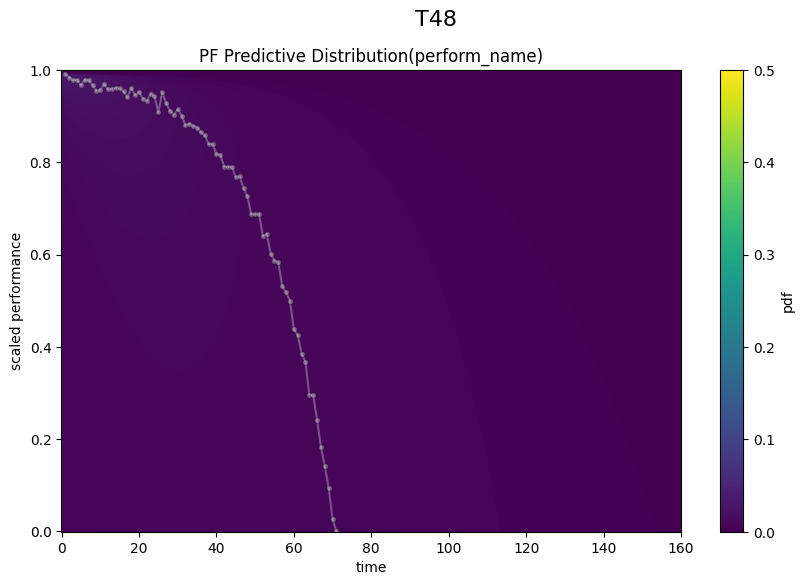

  epoch    train_loss     dur
-------  ------------  ------
      1       76.7181  0.0022
      2       79.8872  0.0018
      3       72.0290  0.0018
      4       66.8040  0.0018
      5       61.9950  0.0018
      6       56.4613  0.0020
      7       48.8762  0.0020
      8       42.5180  0.0019
      9       37.7794  0.0020
     10       33.2107  0.0020
     11       28.1623  0.0018
     12       23.4426  0.0020
     13       20.1012  0.0026
     14       18.5678  0.0022
     15       19.2392  0.0026
     16       22.1203  0.0026
     17       22.8350  0.0019
     18       21.2447  0.0019
     19       20.7138  0.0019
     20       18.6913  0.0019
     21       15.2161  0.0018
     22       13.5993  0.0019
     23       13.4478  0.0019
     24       12.8992  0.0019
     25       12.4230  0.0018
     26       13.0767  0.0018
     27       14.2482  0.0019
     28       14.5971  0.0019
     29       14.4117  0.0019
     30       14.4649  0.0020
     31       14.2956  0.0020
     32   

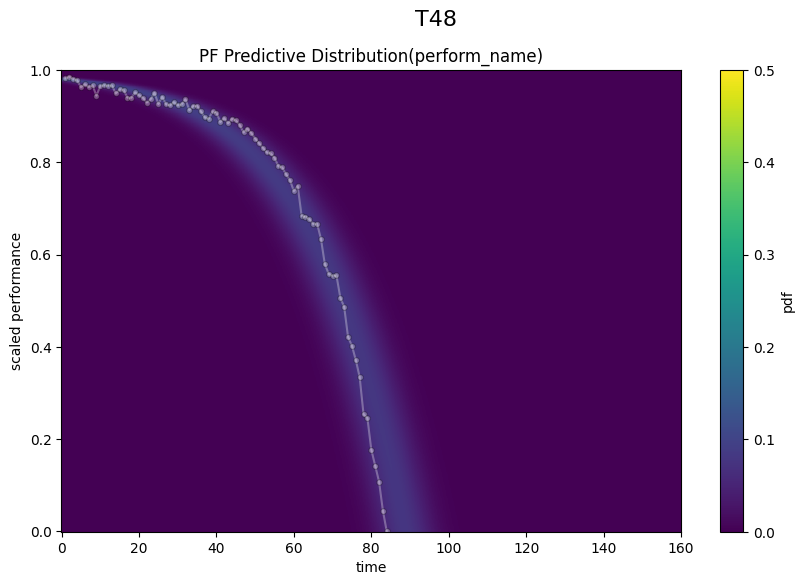

  epoch    train_loss     dur
-------  ------------  ------
      1      205.4813  0.0034
      2      203.1245  0.0030
      3      196.0408  0.0021
      4      188.4828  0.0016
      5      183.0065  0.0015
      6      178.5638  0.0016
      7      174.2597  0.0016
      8      170.0509  0.0015
      9      166.2704  0.0016
     10      163.1833  0.0015
     11      160.8087  0.0016
     12      158.9536  0.0016
     13      157.3562  0.0016
     14      155.8291  0.0016
     15      154.3231  0.0016
     16      152.8958  0.0015
     17      151.6412  0.0016
     18      150.6229  0.0016
     19      149.8472  0.0016
     20      149.2693  0.0016
     21      148.8211  0.0015
     22      148.4429  0.0016
     23      148.1021  0.0016
     24      147.7965  0.0015
     25      147.5403  0.0016
     26      147.3471  0.0015
     27      147.2177  0.0015
     28      147.1363  0.0016
     29      147.0786  0.0015
     30      147.0229  0.0015
     31      146.9597  0.0016
     32   

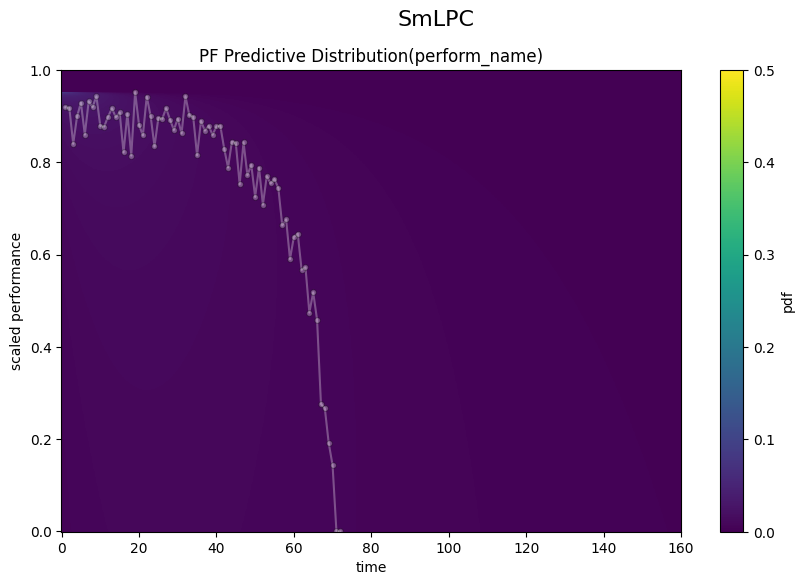

  epoch    train_loss     dur
-------  ------------  ------
      1      207.0020  0.0020
      2      176.6936  0.0016
      3      173.5076  0.0016
      4      177.3727  0.0016
      5      171.6077  0.0016
      6      162.7967  0.0017
      7      155.8090  0.0015
      8      151.5373  0.0014
      9      148.9633  0.0016
     10      146.8589  0.0016
     11      144.5395  0.0015
     12      141.9042  0.0014
     13      139.1958  0.0017
     14      136.7490  0.0016
     15      134.8176  0.0017
     16      133.4907  0.0016
     17      132.6853  0.0016
     18      132.2017  0.0017
     19      131.8125  0.0016
     20      131.3453  0.0014
     21      130.7291  0.0016
     22      129.9917  0.0016
     23      129.2224  0.0017
     24      128.5245  0.0017
     25      127.9757  0.0016
     26      127.6066  0.0016
     27      127.3987  0.0016
     28      127.3002  0.0016
     29      127.2468  0.0016
     30      127.1847  0.0016
     31      127.0844  0.0016
     32   

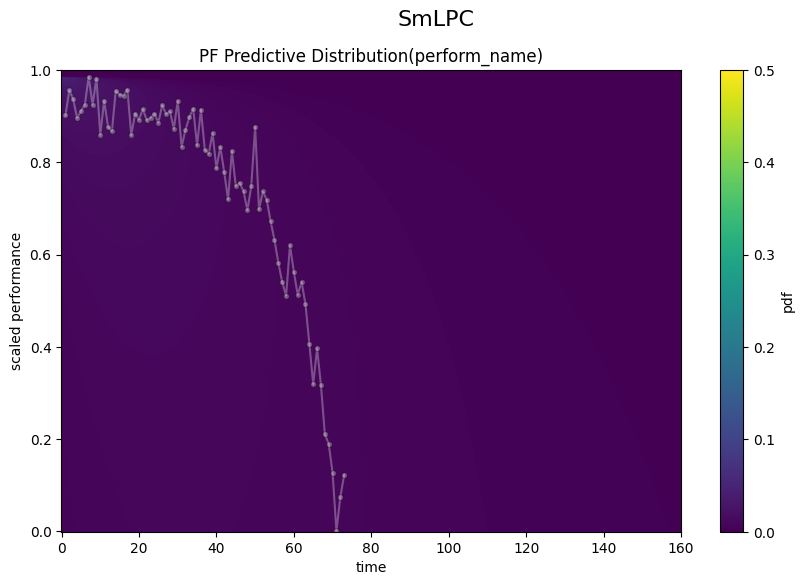

  epoch    train_loss     dur
-------  ------------  ------
      1      606.6758  0.0020
      2      567.8539  0.0015
      3      533.4542  0.0015
      4      501.8123  0.0014
      5      472.1454  0.0015
      6      444.1385  0.0014
      7      417.7225  0.0015
      8      392.9494  0.0015
      9      369.9231  0.0015
     10      348.7573  0.0015
     11      329.5491  0.0015
     12      312.3585  0.0014
     13      297.1939  0.0015
     14      284.0016  0.0014
     15      272.6606  0.0015
     16      262.9846  0.0015
     17      254.7347  0.0015
     18      247.6378  0.0015
     19      241.4158  0.0014
     20      235.8119  0.0015
     21      230.6167  0.0014
     22      225.6812  0.0015
     23      220.9214  0.0015
     24      216.3125  0.0014
     25      211.8739  0.0015
     26      207.6537  0.0015
     27      203.7115  0.0015
     28      200.1027  0.0015
     29      196.8676  0.0015
     30      194.0233  0.0014
     31      191.5615  0.0016
     32   

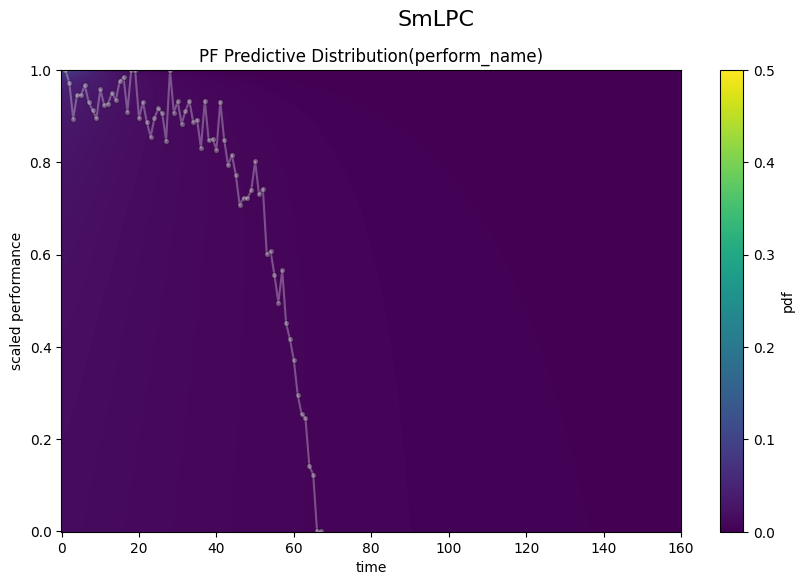

  epoch    train_loss     dur
-------  ------------  ------
      1      242.6241  0.0019
      2      212.1006  0.0016
      3      209.0627  0.0016
      4      202.8085  0.0016
      5      189.8407  0.0016
      6      176.6391  0.0016
      7      165.5088  0.0015
      8      156.3205  0.0016
      9      148.3118  0.0016
     10      140.9114  0.0016
     11      133.9049  0.0016
     12      127.3311  0.0016
     13      121.3349  0.0015
     14      116.0557  0.0016
     15      111.5678  0.0016
     16      107.8583  0.0015
     17      104.8358  0.0016
     18      102.3573  0.0016
     19      100.2603  0.0016
     20       98.3970  0.0016
     21       96.6575  0.0016
     22       94.9803  0.0016
     23       93.3511  0.0016
     24       91.7903  0.0015
     25       90.3367  0.0015
     26       89.0315  0.0015
     27       87.9055  0.0015
     28       86.9713  0.0015
     29       86.2208  0.0015
     30       85.6291  0.0015
     31       85.1605  0.0015
     32   

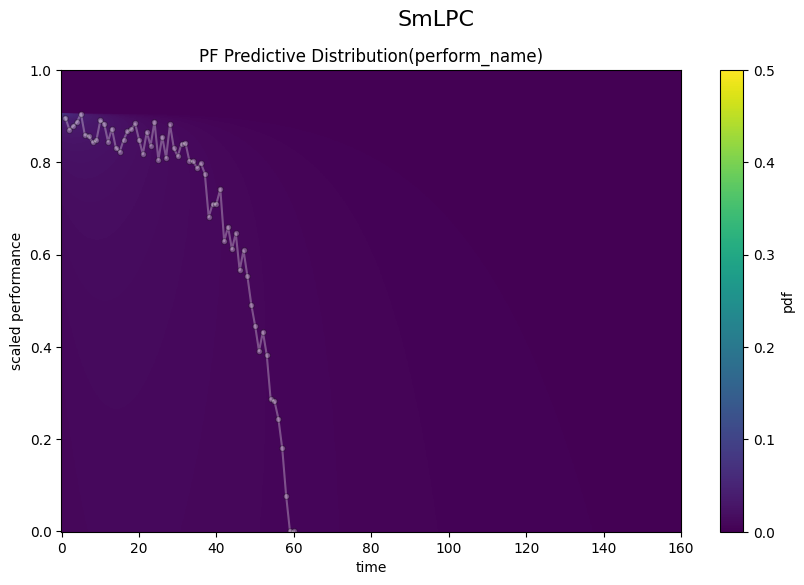

  epoch    train_loss     dur
-------  ------------  ------
      1      212.1274  0.0022
      2      214.7142  0.0018
      3      211.5711  0.0018
      4      209.3062  0.0018
      5      210.7625  0.0017
      6      210.2070  0.0018
      7      208.1125  0.0017
      8      207.5573  0.0017
      9      208.0558  0.0018
     10      207.5810  0.0018
     11      206.2113  0.0018
     12      205.4084  0.0018
     13      205.5828  0.0017
     14      205.3726  0.0017
     15      204.3168  0.0017
     16      203.5885  0.0018
     17      203.5728  0.0017
     18      203.3534  0.0017
     19      202.5611  0.0017
     20      201.9348  0.0016
     21      201.8674  0.0018
     22      201.5978  0.0018
     23      200.8826  0.0018
     24      200.4692  0.0018
     25      200.3607  0.0018
     26      199.9365  0.0018
     27      199.3500  0.0018
     28      199.1039  0.0018
     29      198.8717  0.0017
     30      198.3308  0.0018
     31      197.9466  0.0018
     32   

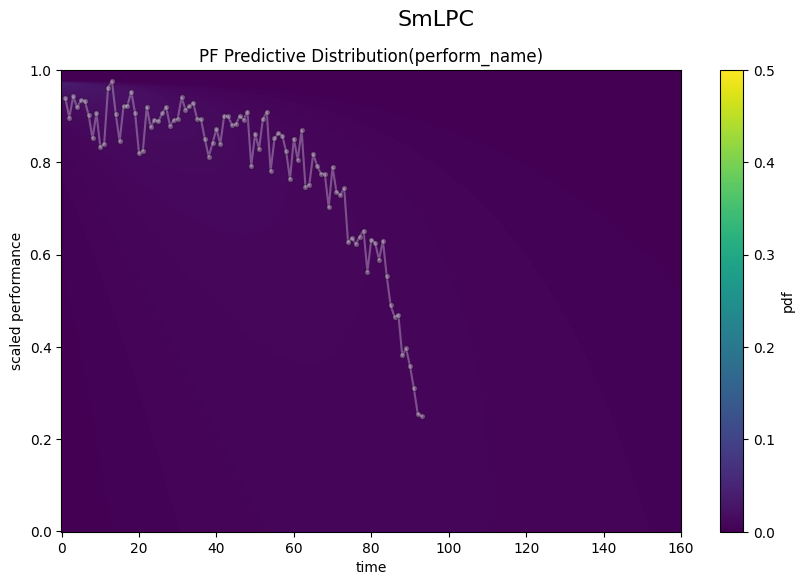

  epoch    train_loss     dur
-------  ------------  ------
      1      396.9422  0.0019
      2      325.7142  0.0017
      3      275.1465  0.0017
      4      253.7056  0.0017
      5      261.5459  0.0016
      6      266.5167  0.0017
      7      255.2606  0.0017
      8      238.0918  0.0017
      9      222.5507  0.0017
     10      210.8527  0.0016
     11      202.5121  0.0016
     12      196.3099  0.0017
     13      191.1733  0.0017
     14      186.4164  0.0017
     15      181.7114  0.0016
     16      176.9829  0.0017
     17      172.3037  0.0017
     18      167.8094  0.0017
     19      163.6429  0.0016
     20      159.9170  0.0016
     21      156.6957  0.0016
     22      153.9895  0.0016
     23      151.7595  0.0017
     24      149.9297  0.0016
     25      148.4024  0.0016
     26      147.0743  0.0016
     27      145.8516  0.0017
     28      144.6602  0.0016
     29      143.4525  0.0017
     30      142.2075  0.0017
     31      140.9279  0.0016
     32   

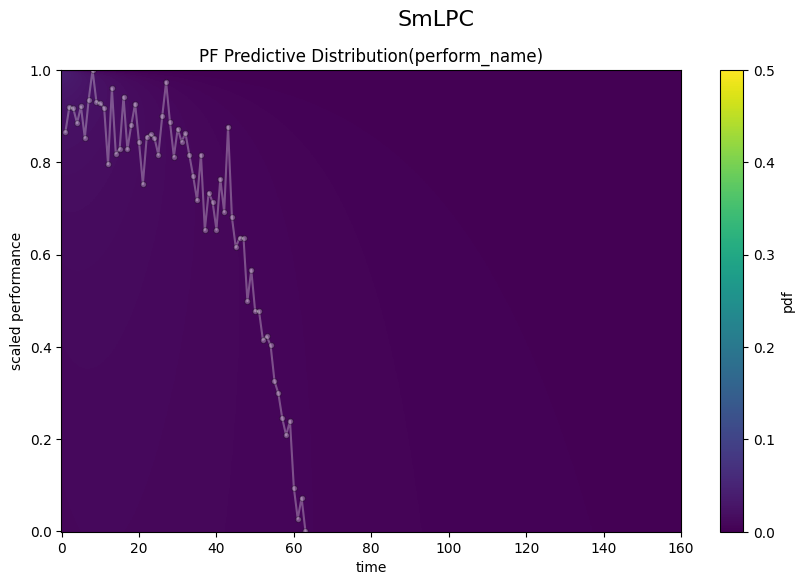

  epoch    train_loss     dur
-------  ------------  ------
      1      268.2508  0.0020
      2      225.9800  0.0016
      3      222.1463  0.0016
      4      220.9543  0.0019
      5      209.0363  0.0019
      6      192.8797  0.0019
      7      179.3088  0.0019
      8      168.7151  0.0020
      9      159.9970  0.0020
     10      151.9449  0.0020
     11      143.6361  0.0020
     12      134.7692  0.0019
     13      125.3437  0.0019
     14      115.7847  0.0019
     15      107.4590  0.0017
     16      102.8746  0.0017
     17      104.9714  0.0017
     18      111.1182  0.0017
     19      111.1326  0.0014
     20      107.5695  0.0016
     21      107.7845  0.0016
     22      111.4724  0.0016
     23      112.6705  0.0016
     24      108.6853  0.0016
     25      102.8883  0.0016
     26       99.9812  0.0017
     27       99.6153  0.0017
     28       97.3688  0.0017
     29       92.8526  0.0016
     30       89.2318  0.0016
     31       87.9194  0.0016
     32   

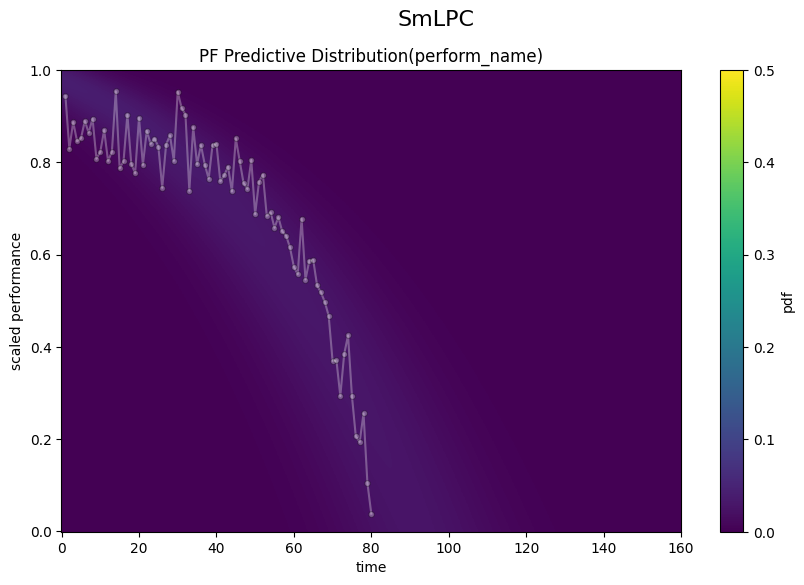

  epoch    train_loss     dur
-------  ------------  ------
      1      484.1024  0.0021
      2      467.1409  0.0015
      3      404.8994  0.0015
      4      392.1324  0.0015
      5      364.9008  0.0014
      6      334.2823  0.0014
      7      304.4692  0.0015
      8      277.4688  0.0015
      9      251.7031  0.0015
     10      227.9998  0.0015
     11      206.5778  0.0014
     12      187.7193  0.0015
     13      171.4384  0.0015
     14      157.6851  0.0015
     15      146.6610  0.0015
     16      139.1307  0.0015
     17      136.2717  0.0015
     18      138.9644  0.0016
     19      146.0561  0.0015
     20      153.2408  0.0018
     21      156.5830  0.0019
     22      156.1625  0.0018
     23      154.5939  0.0018
     24      154.1940  0.0019
     25      155.3722  0.0018
     26      156.7465  0.0018
     27      156.6044  0.0018
     28      154.2631  0.0018
     29      150.3167  0.0018
     30      146.0019  0.0018
     31      142.3903  0.0018
     32   

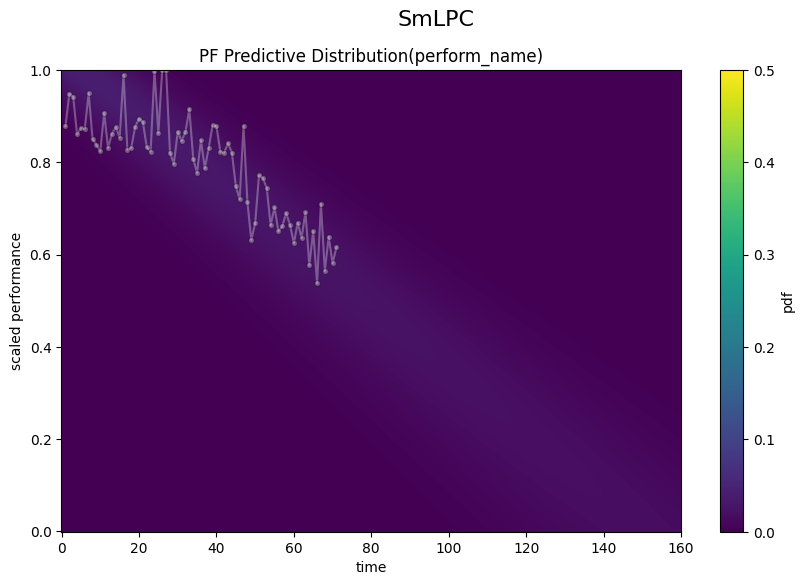

  epoch    train_loss     dur
-------  ------------  ------
      1      180.5714  0.0020
      2      184.7814  0.0016
      3      179.7762  0.0016
      4      177.0479  0.0015
      5      178.0033  0.0016
      6      177.2489  0.0016
      7      162.7215  0.0016
      8      156.8560  0.0016
      9      150.7789  0.0016
     10      145.7737  0.0016
     11      140.0527  0.0016
     12      133.9684  0.0016
     13      128.1146  0.0016
     14      122.8399  0.0016
     15      117.8275  0.0016
     16      112.7449  0.0016
     17      107.5980  0.0016
     18      102.8117  0.0016
     19       98.9469  0.0016
     20       96.7522  0.0016
     21       97.0808  0.0015
     22       98.4093  0.0016
     23       95.8521  0.0016
     24       92.1757  0.0016
     25       93.0905  0.0016
     26       93.6669  0.0016
     27       88.7370  0.0016
     28       84.8062  0.0016
     29       84.7824  0.0016
     30       82.3286  0.0016
     31       78.4865  0.0015
     32   

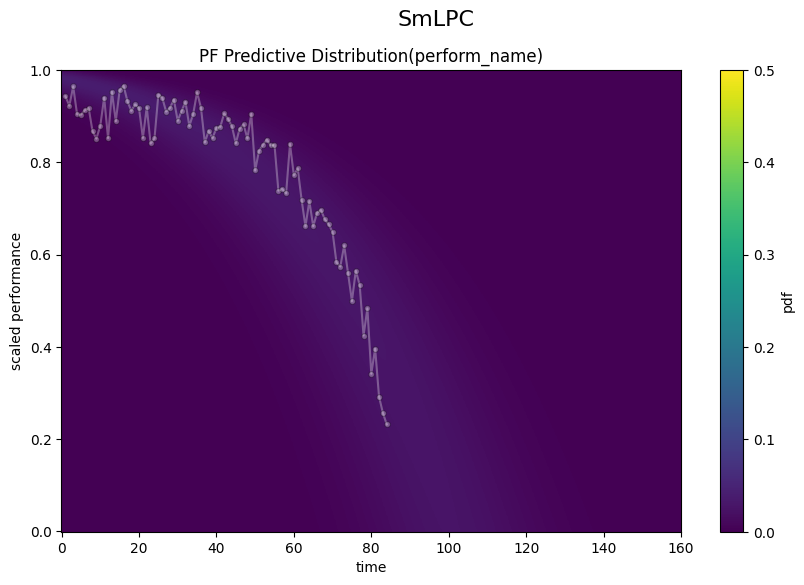

  epoch    train_loss     dur
-------  ------------  ------
      1      189.2996  0.0021
      2      182.3329  0.0016
      3      156.6342  0.0015
      4      152.3763  0.0015
      5      141.5131  0.0015
      6      128.5021  0.0016
      7      119.4449  0.0016
      8      110.5344  0.0021
      9      102.5779  0.0024
     10       95.7244  0.0022
     11       89.8754  0.0018
     12       84.9602  0.0015
     13       80.7173  0.0015
     14       77.1478  0.0015
     15       74.8801  0.0015
     16       75.2342  0.0015
     17       79.0830  0.0015
     18       83.1198  0.0015
     19       82.7960  0.0016
     20       79.9644  0.0015
     21       78.0647  0.0015
     22       77.4043  0.0015
     23       76.1344  0.0016
     24       73.2354  0.0015
     25       69.6224  0.0015
     26       66.9302  0.0015
     27       65.8857  0.0015
     28       65.7441  0.0016
     29       65.1933  0.0015
     30       63.6711  0.0016
     31       61.7145  0.0015
     32   

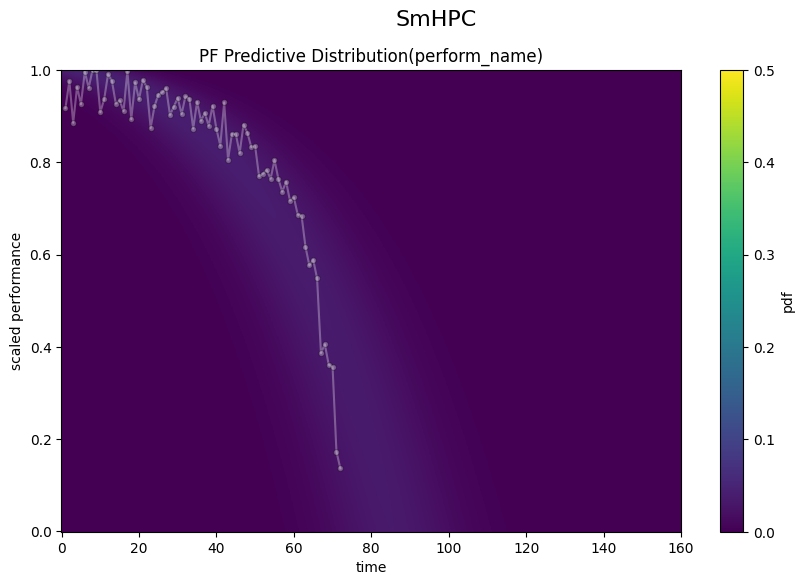

  epoch    train_loss     dur
-------  ------------  ------
      1      177.3184  0.0023
      2      157.3942  0.0019
      3      160.8469  0.0019
      4      158.1585  0.0021
      5      150.5321  0.0021
      6      144.2085  0.0020
      7      140.5365  0.0025
      8      138.3484  0.0020
      9      136.3160  0.0021
     10      133.9093  0.0030
     11      131.2820  0.0033
     12      128.8532  0.0022
     13      126.9767  0.0020
     14      125.7698  0.0021
     15      125.0990  0.0018
     16      124.6826  0.0025
     17      124.2483  0.0025
     18      123.6533  0.0026
     19      122.9110  0.0018
     20      122.1367  0.0019
     21      121.4664  0.0018
     22      120.9895  0.0018
     23      120.7208  0.0018
     24      120.6099  0.0019
     25      120.5731  0.0019
     26      120.5333  0.0018
     27      120.4473  0.0018
     28      120.3138  0.0021
     29      120.1634  0.0021
     30      120.0362  0.0026
     31      119.9616  0.0025
     32   

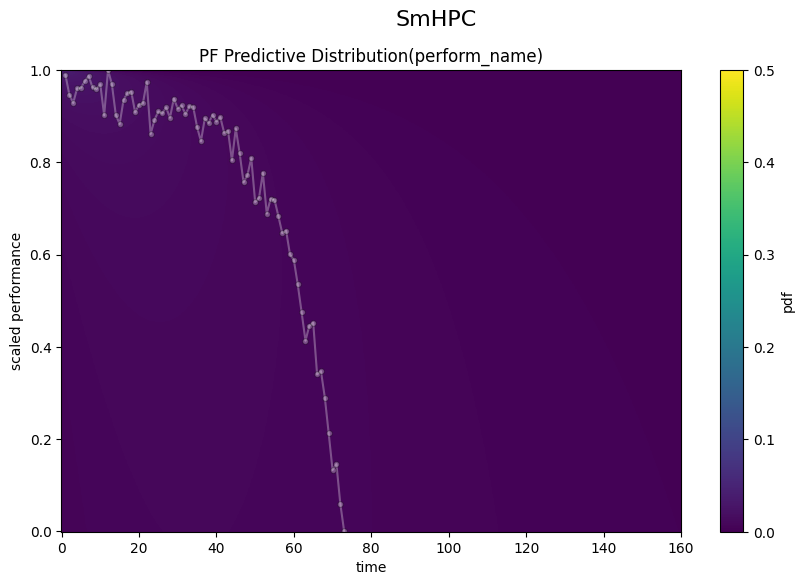

  epoch    train_loss     dur
-------  ------------  ------
      1      396.6832  0.0033
      2      370.9409  0.0028
      3      349.0478  0.0019
      4      329.0923  0.0015
      5      310.2571  0.0015
      6      292.3174  0.0029
      7      275.3091  0.0021
      8      259.3567  0.0022
      9      244.5941  0.0021
     10      231.1329  0.0017
     11      219.0495  0.0015
     12      208.3774  0.0015
     13      199.0993  0.0015
     14      191.1446  0.0015
     15      184.3891  0.0015
     16      178.6651  0.0015
     17      173.7772  0.0016
     18      169.5248  0.0015
     19      165.7272  0.0015
     20      162.2419  0.0015
     21      158.9753  0.0015
     22      155.8836  0.0015
     23      152.9639  0.0016
     24      150.2416  0.0015
     25      147.7547  0.0016
     26      145.5396  0.0015
     27      143.6207  0.0015
     28      142.0024  0.0016
     29      140.6685  0.0015
     30      139.5835  0.0015
     31      138.6989  0.0015
     32   

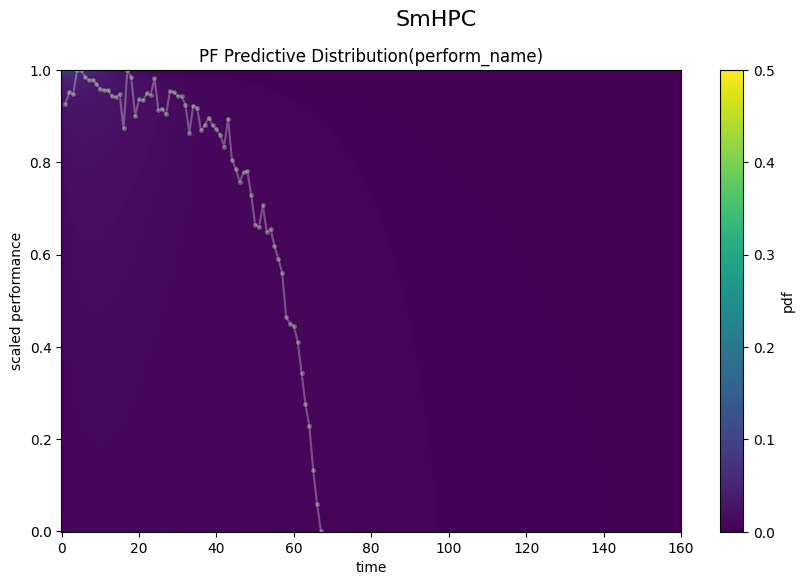

  epoch    train_loss     dur
-------  ------------  ------
      1      200.1365  0.0022
      2      164.1235  0.0018
      3      151.5283  0.0017
      4      152.3251  0.0017
      5      135.4975  0.0018
      6      116.0522  0.0017
      7       97.3262  0.0016
      8       82.8930  0.0017
      9       70.8250  0.0017
     10       60.0237  0.0017
     11       49.7043  0.0017
     12       39.9229  0.0017
     13       31.2998  0.0017
     14       24.6838  0.0025
     15       21.0215  0.0023
     16       21.2769  0.0023
     17       24.3798  0.0023
     18       25.3408  0.0023
     19       23.8619  0.0017
     20       24.5085  0.0017
     21       28.1998  0.0016
     22       31.4368  0.0016
     23       31.4642  0.0016
     24       29.2296  0.0016
     25       27.7930  0.0017
     26       28.2679  0.0016
     27       28.1168  0.0016
     28       25.9229  0.0016
     29       23.3057  0.0016
     30       21.6226  0.0016
     31       20.7203  0.0016
     32   

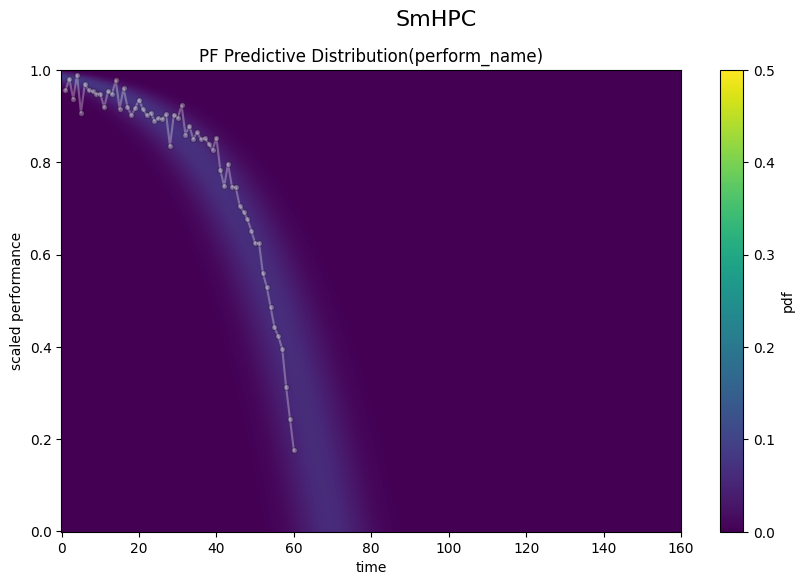

  epoch    train_loss     dur
-------  ------------  ------
      1      146.4986  0.0020
      2      133.5567  0.0017
      3      125.4077  0.0018
      4      127.0901  0.0018
      5      120.2728  0.0017
      6      110.8191  0.0017
      7      105.0723  0.0017
      8      101.6072  0.0017
      9       98.3413  0.0017
     10       93.4330  0.0017
     11       87.3279  0.0017
     12       81.5643  0.0017
     13       77.0383  0.0017
     14       73.8495  0.0017
     15       72.6298  0.0017
     16       74.0716  0.0017
     17       72.3614  0.0017
     18       66.2364  0.0017
     19       63.9431  0.0017
     20       67.4188  0.0017
     21       68.5881  0.0017
     22       63.5924  0.0017
     23       58.8445  0.0017
     24       59.5226  0.0017
     25       59.8171  0.0017
     26       56.0982  0.0016
     27       53.2957  0.0017
     28       53.8889  0.0017
     29       54.9630  0.0017
     30       53.9810  0.0017
     31       52.3386  0.0017
     32   

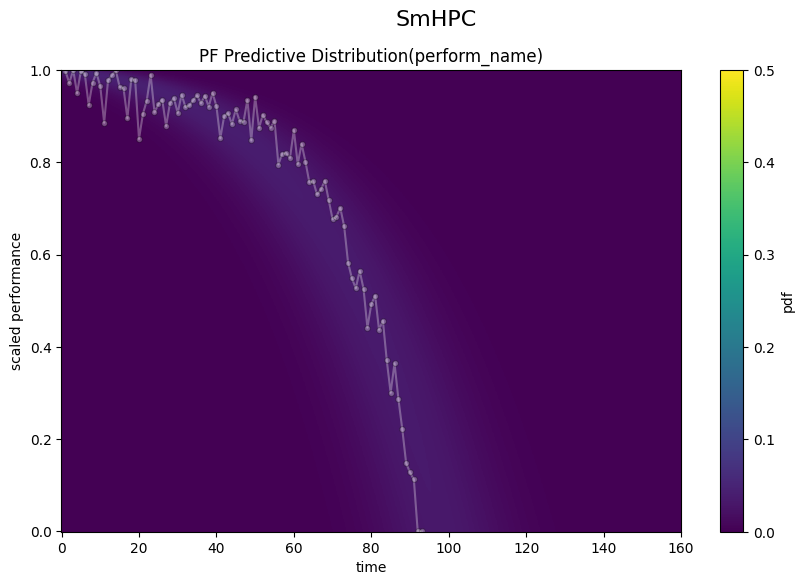

  epoch    train_loss     dur
-------  ------------  ------
      1      279.9997  0.0022
      2      229.2444  0.0017
      3      205.8688  0.0016
      4      209.8021  0.0016
      5      211.4992  0.0016
      6      201.4113  0.0016
      7      187.9111  0.0016
      8      176.2966  0.0016
      9      167.8007  0.0014
     10      161.7016  0.0015
     11      156.8622  0.0016
     12      152.4292  0.0016
     13      147.9868  0.0015
     14      143.4674  0.0016
     15      139.0051  0.0015
     16      134.8053  0.0014
     17      131.0559  0.0016
     18      127.8772  0.0014
     19      125.2993  0.0015
     20      123.2693  0.0015
     21      121.6723  0.0016
     22      120.3631  0.0015
     23      119.1993  0.0015
     24      118.0679  0.0016
     25      116.9003  0.0015
     26      115.6750  0.0016
     27      114.4106  0.0015
     28      113.1505  0.0016
     29      111.9479  0.0015
     30      110.8514  0.0016
     31      109.8944  0.0016
     32   

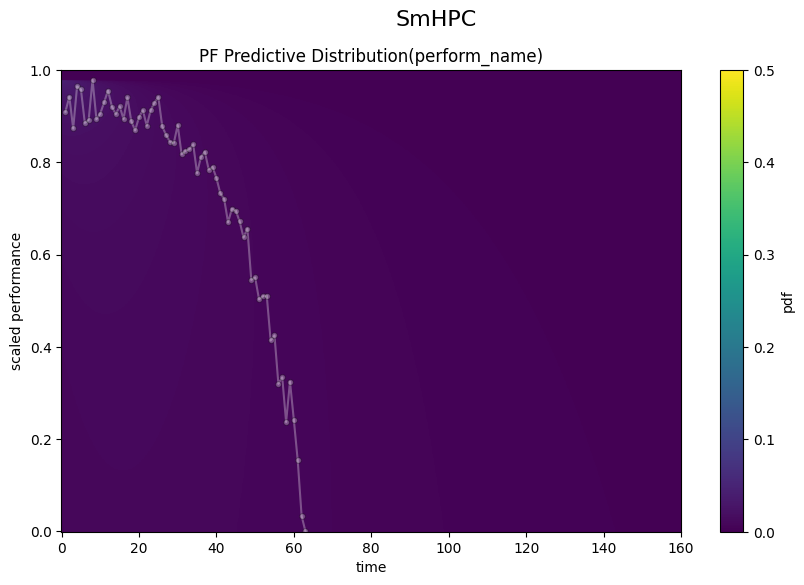

  epoch    train_loss     dur
-------  ------------  ------
      1      138.7653  0.0022
      2      125.4984  0.0021
      3      124.8477  0.0019
      4      118.8331  0.0019
      5      106.2190  0.0019
      6       96.8890  0.0020
      7       90.3472  0.0019
      8       83.8456  0.0019
      9       76.4844  0.0019
     10       68.7924  0.0020
     11       61.8019  0.0019
     12       56.2433  0.0019
     13       52.1053  0.0018
     14       49.0405  0.0020
     15       47.6837  0.0020
     16       50.4634  0.0019
     17       55.6749  0.0019
     18       54.2152  0.0019
     19       50.1296  0.0020
     20       49.7016  0.0025
     21       50.5454  0.0026
     22       48.0001  0.0025
     23       43.3660  0.0026
     24       40.6948  0.0026
     25       40.8097  0.0026
     26       40.9719  0.0036
     27       39.5520  0.0026
     28       37.7984  0.0026
     29       37.4172  0.0020
     30       38.3862  0.0017
     31       38.9851  0.0018
     32   

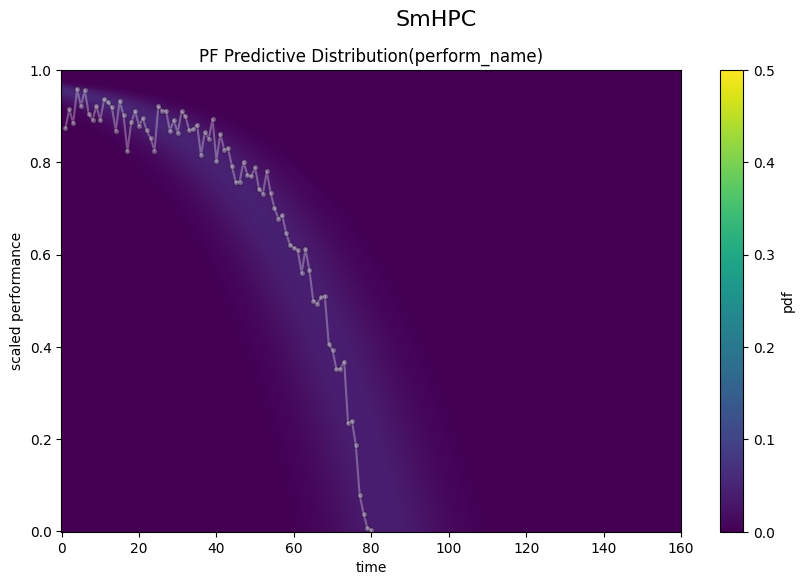

  epoch    train_loss     dur
-------  ------------  ------
      1      221.1326  0.0023
      2      188.1030  0.0018
      3      182.3881  0.0018
      4      185.4654  0.0018
      5      179.0487  0.0018
      6      169.0530  0.0018
      7      160.4136  0.0018
      8      154.3197  0.0018
      9      150.0849  0.0018
     10      146.6747  0.0018
     11      143.4124  0.0018
     12      126.5613  0.0018
     13      115.1089  0.0018
     14      108.5086  0.0018
     15      100.3807  0.0018
     16       93.0864  0.0018
     17       86.0002  0.0018
     18       79.5758  0.0018
     19       73.6620  0.0018
     20       68.1813  0.0018
     21       63.1296  0.0018
     22       58.5610  0.0018
     23       54.6156  0.0018
     24       51.6125  0.0018
     25       50.3922  0.0016
     26       52.5601  0.0018
     27       58.2619  0.0018
     28       61.7817  0.0018
     29       59.2897  0.0018
     30       54.2958  0.0018
     31       50.7712  0.0018
     32   

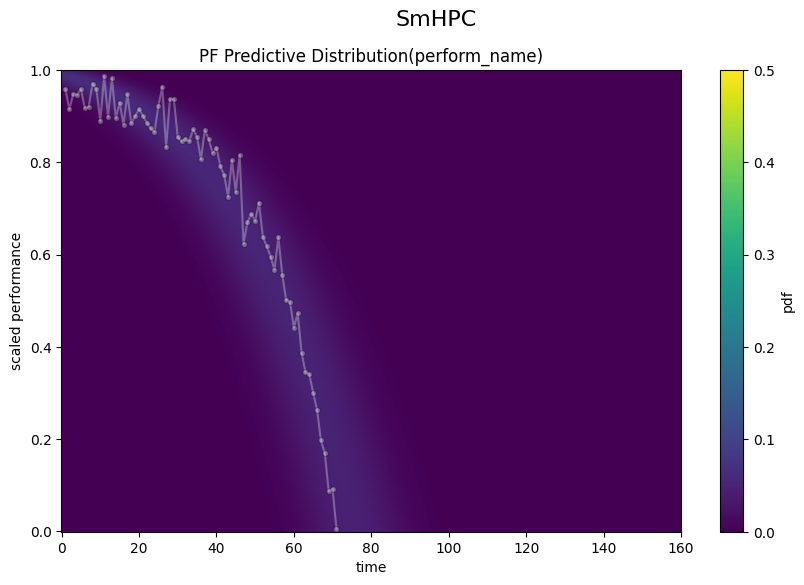

  epoch    train_loss     dur
-------  ------------  ------
      1      147.2681  0.0021
      2      137.4207  0.0017
      3      142.5490  0.0017
      4      139.1054  0.0017
      5      135.1682  0.0016
      6      134.7749  0.0016
      7      135.8088  0.0015
      8      135.7076  0.0018
      9      134.3188  0.0018
     10      132.8385  0.0016
     11      132.2732  0.0016
     12      132.6304  0.0017
     13      133.0729  0.0017
     14      132.9021  0.0016
     15      132.2075  0.0016
     16      131.5485  0.0017
     17      131.3226  0.0016
     18      131.4772  0.0016
     19      131.6655  0.0017
     20      131.5957  0.0017
     21      131.2501  0.0017
     22      130.8388  0.0037
     23      130.5894  0.0030
     24      130.5551  0.0019
     25      130.5871  0.0017
     26      130.4922  0.0017
     27      130.2189  0.0017
     28      129.8851  0.0017
     29      129.6410  0.0016
     30      129.5237  0.0017
     31      129.4412  0.0017
     32   

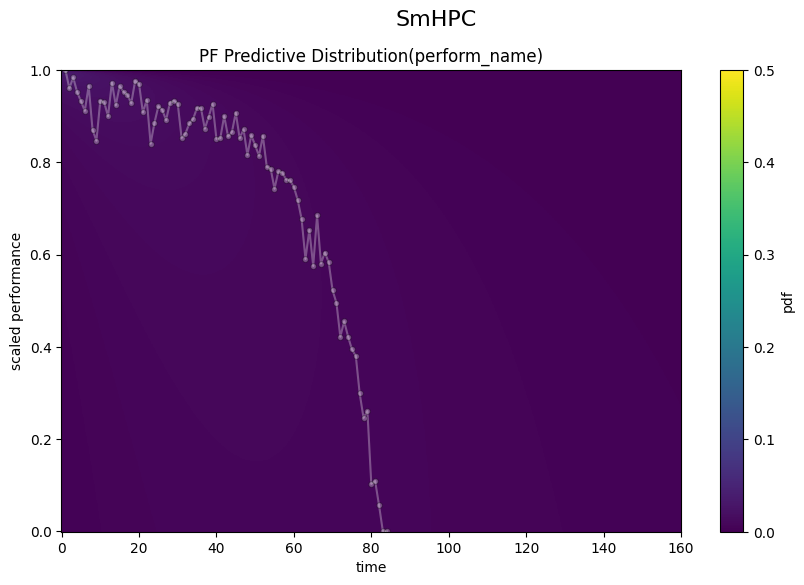

In [6]:
resolution = 1024
t_end = 160

s_grid = np.linspace(0, 1, resolution)
t_grid = np.linspace(0, t_end, resolution)

colors = plt.get_cmap('tab10')

perform_states = {}
perform_train_interp = {}

for name, units_perform in performs_train.items():
    states = []
    perform_interp = []

    for unit, perform in units_perform.items():
        t_train = time_train[unit]
        s_train = perform

        # ---- model + loss ----
        model = DistModel(max_s=max(perform))
        criterion = CombinedGammaLoss(alpha=0.50)

        # ---- SKORCH FIT (replacement of fit()) ----
        best_model = fit_with_skorch(
            s_train=s_train,
            t_train=t_train,
            max_s=max(perform),
            criterion=criterion,
            lr=1,
            max_epochs=10000,
        )

        # ---- extract parameters ----
        params = best_model.get_parameters()
        mean = params["mean"]
        var  = params["variance"]
        p    = params["p"]
        mu   = params["mu"]
        a    = params["a"]

        state = np.array([
            mean.item(),
            var.item(),
            p.item(),
            mu.item(),
            a.item()
        ])

        # ---- plotting (unchanged) ----
        ParticleFilter.plot_states(
            np.stack(state[np.newaxis, :], axis=0),
            t_end,
            t_train,
            perform,
            multiply_level=None,
            n_particles=None,
            title=name,
            resolution=1024,
        )
        plt.show()

        states.append(state)
        perform_interp.append(t_train)

    perform_states[name] = np.stack(states)
    perform_train_interp[name] = perform_interp

In [7]:
perform_train_interp={}
for j, (name,units_perform) in enumerate(performs_train.items()):
    if j==0: 
        time_train_interp = []
    perform_interp = []
    for unit,perform in enumerate(units_perform):
        t_interp,s_interp=interpolate(time_train[unit],perform,n_points=20,tilt=3)
        data=s_interp,t_interp
        if j==0: 
            time_train_interp.append(data[1])
        perform_interp.append(data[0])
    perform_train_interp[name]=perform_interp

KeyError: 0

## Save

In [ ]:
with open(f'{exp}/states.pkl', 'wb') as f:
    dump(perform_states,f)
    
with open(f'{exp}/states_data_interp.pkl', 'wb') as f:
    dump((time_train_interp,perform_train_interp),f)

## Load already learned states.

In [ ]:
with open(f'data/{dataset_name}/time_train.pkl', 'rb') as file:
    time_train = load(file)
        
with open(f'data/{dataset_name}/performs_train.pkl', 'rb') as file:
    performs_train  = load(file)
    
with open(f'{exp}/states.pkl', 'rb') as f:
    perform_states=load(f)
    
with open(f'{exp}/states_data_interp.pkl', 'rb') as f:
    states_data_interp = load(f)
time_train_interp,perform_train_interp = states_data_interp

## Show States

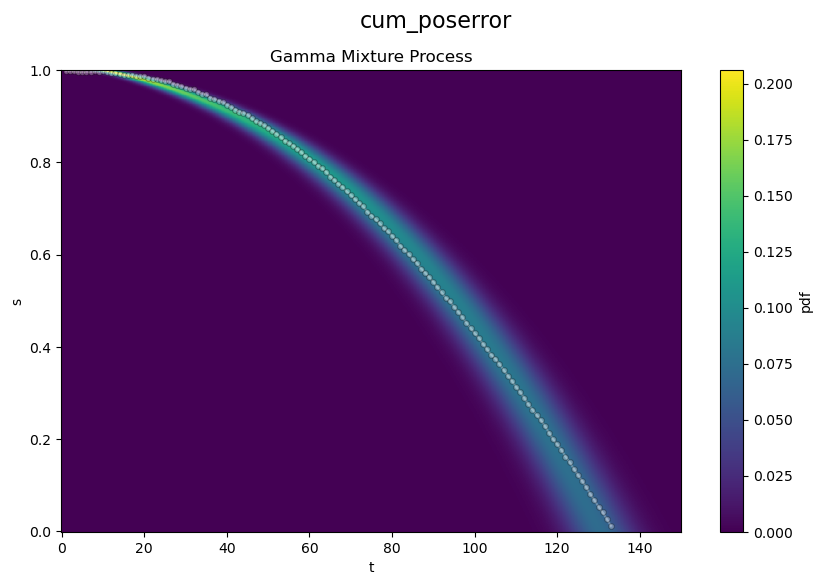

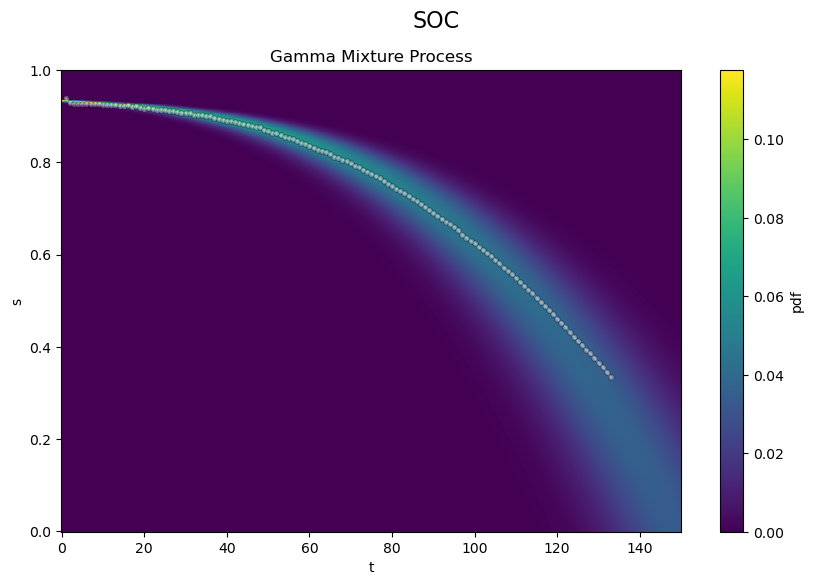

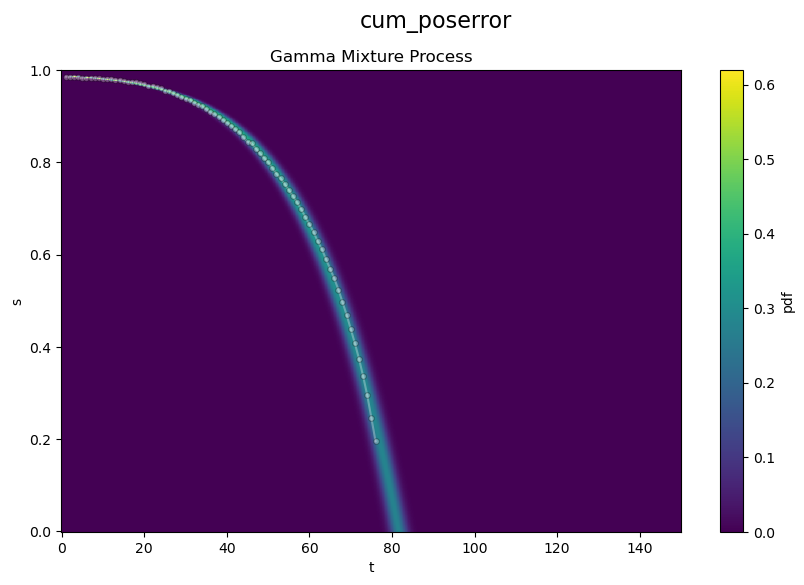

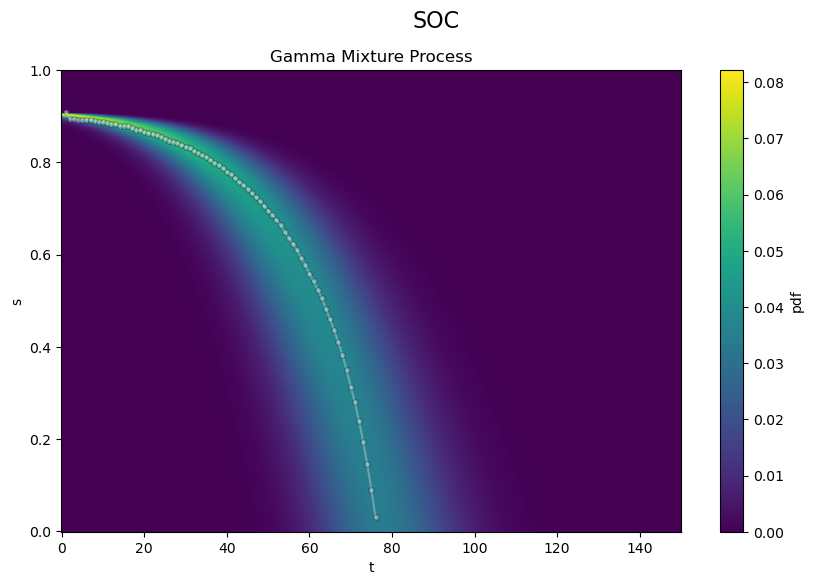

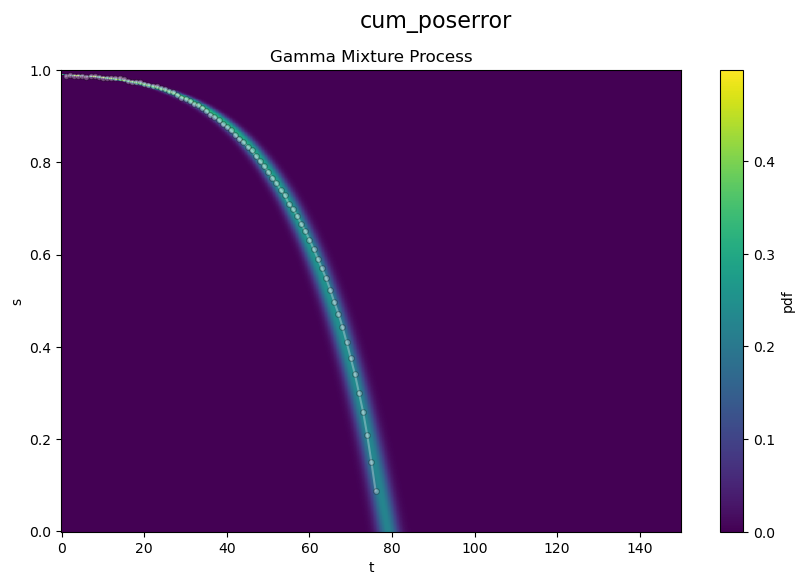

...

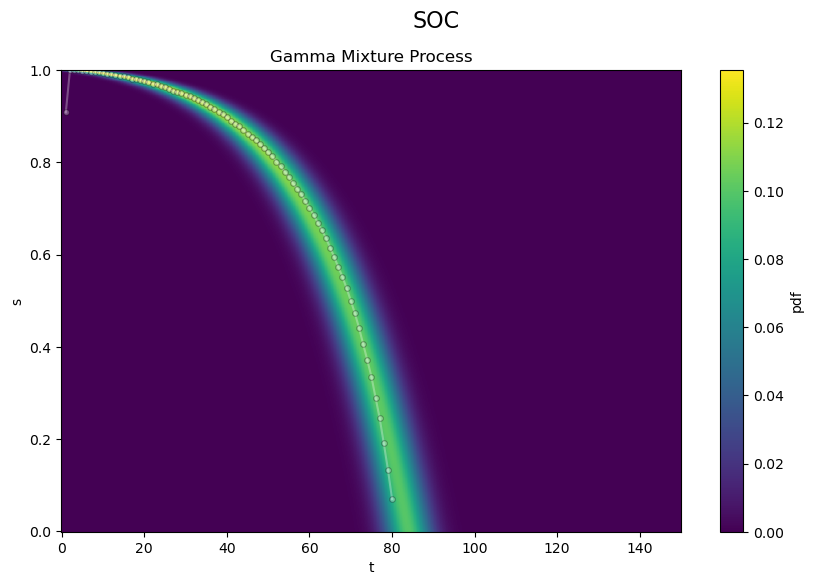

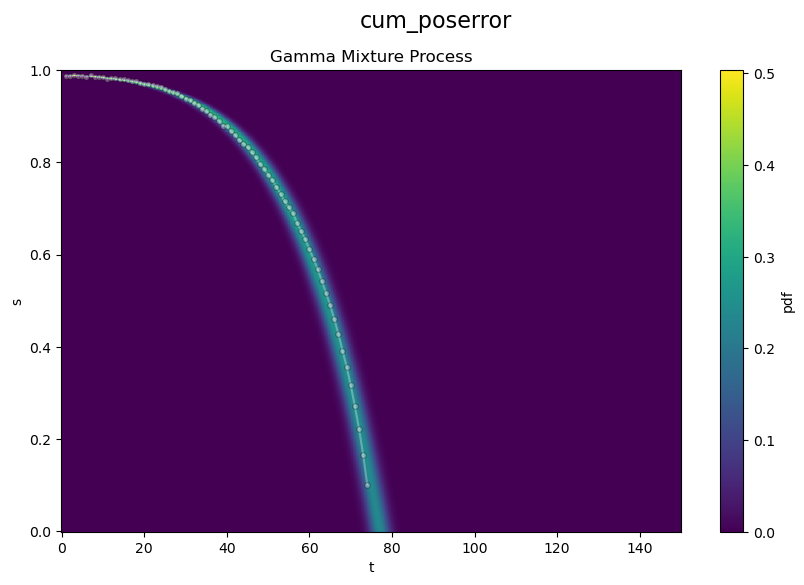

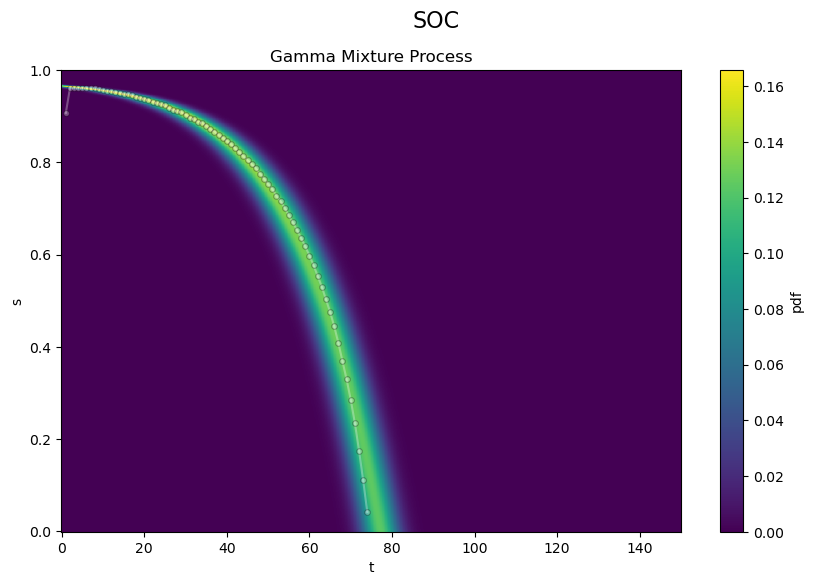

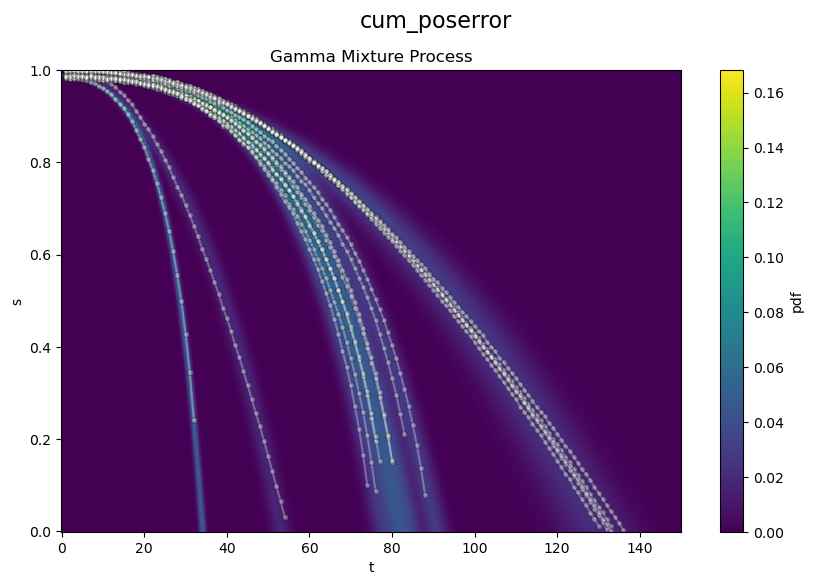

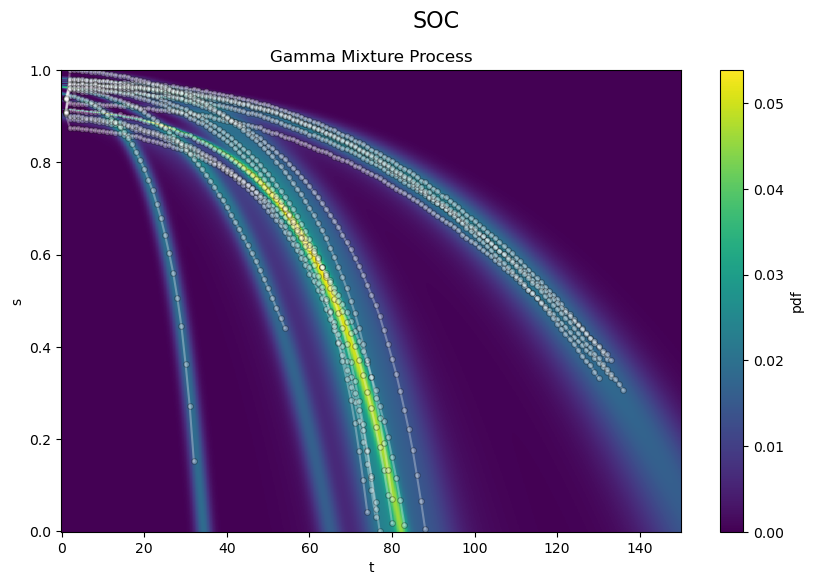

In [ ]:
resolution=1024
t_end=150
s = np.linspace(0,1,resolution)
t = np.linspace(0,t_end,resolution)

for i,t_train in enumerate(time_train):
    for (name,states),perf_train,perf_interp in zip(
        perform_states.items(),
        performs_train.values(),
        perform_train_interp.values()
        ):
        ParticleFilter.plot_states(
                np.stack(states[[i]],axis=0),
                t_end,
                t_train,
                perf_train[i],
                multiply_level=None,
                n_particles=None,
                title=name,
                resolution=1024)
        plt.show()


for (name,states),perf_train,perf_interp in zip(
    perform_states.items(),
    performs_train.values(),
    perform_train_interp.values()
    ):
    ParticleFilter.plot_states(
            np.stack(states,axis=0),
            t_end,
            time_train,
            perf_train,
            multiply_level=None,
            n_particles=None,
            title=name,
            resolution=1024)

## Save States

In [ ]:
with open(f'{exp}/states.pkl', 'wb') as f:
    dump(perform_states, f)
    
states_data_interp=time_train_interp,perform_train_interp
with open(f'{exp}/states_data_interp.pkl', 'wb') as f:
    dump(states_data_interp, f)

## Gamma mixture model 

In [ ]:
gmp_dic={}
for name,states in perform_states.items():
    mean,var,p,pos_mu,a=states.T
    shapes,rates=stats2params(mean,var) 
    N=len(states)
    scales=1/rates
    loc = -pos_mu
    weights=np.ones(N)/N
    gmp_dic[name]=GammaMixtureProcess(shapes,scales,p,loc,a,weights)

## Plots

In [ ]:
resolution=1024
s = np.linspace(0,1,resolution)
t = np.linspace(0,t_end,resolution)

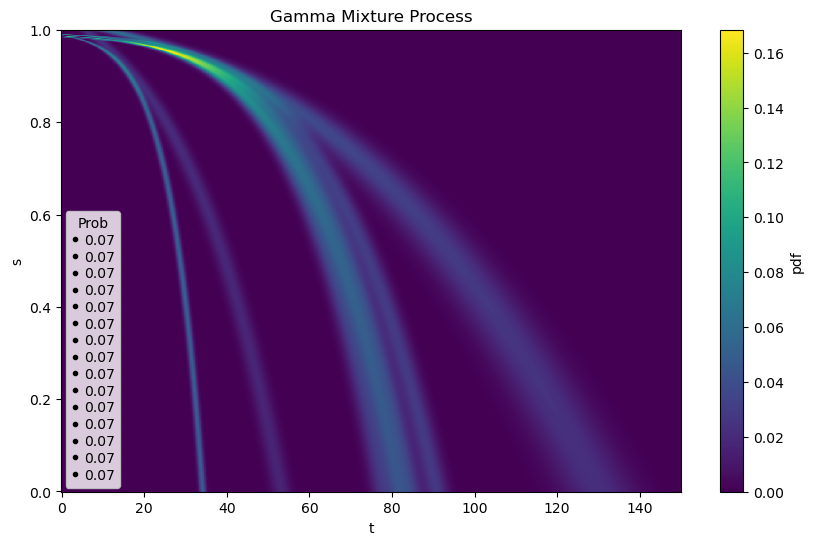

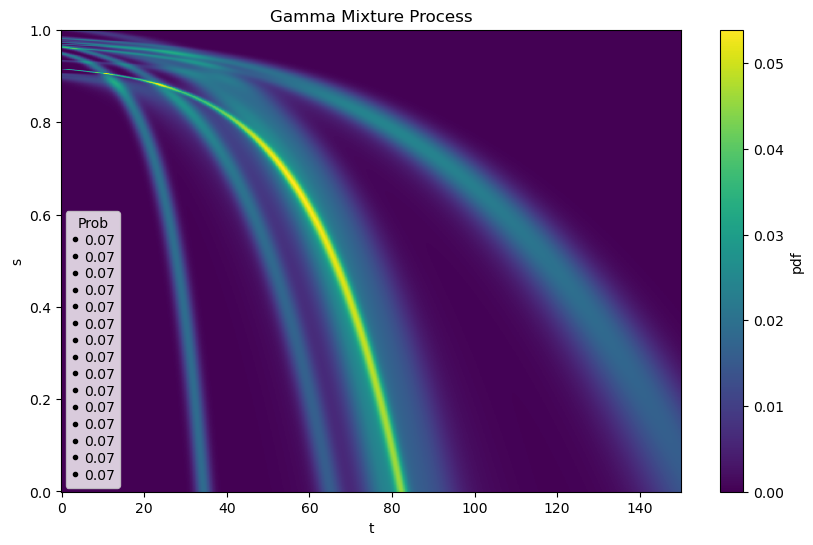

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_dist(t,s,func='pdf',show_prob=True,gamma_prob=1) 
    plt.show()

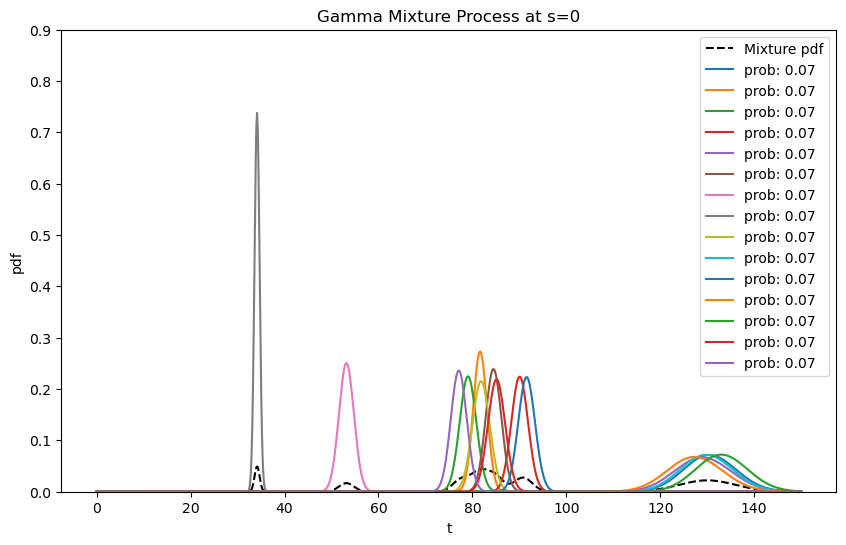

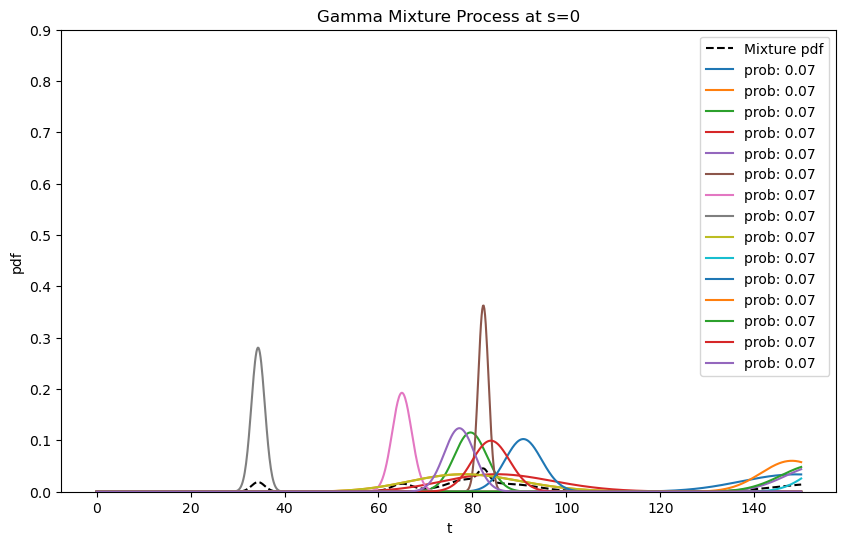

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_rv_dist(t,s=0,func='pdf',show_prob=True,show_comp=True, max_prob=0.9,conf_level=0) 
    plt.show()

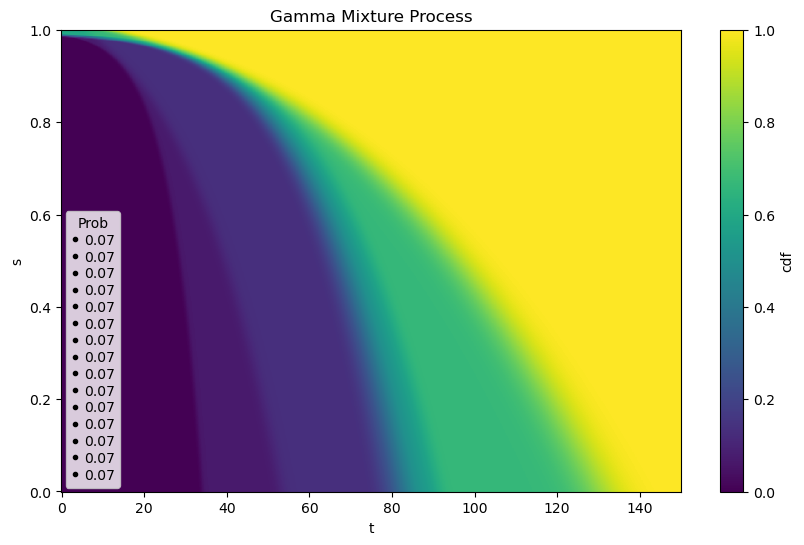

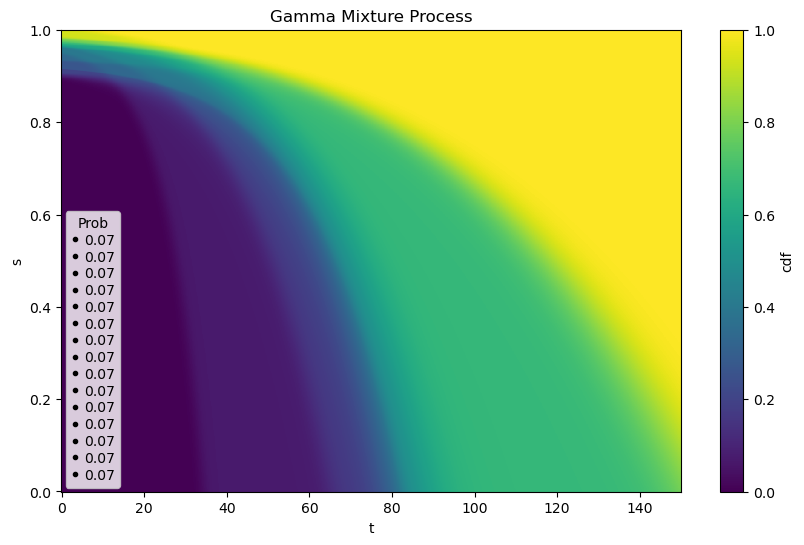

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_dist(t,s,func='cdf',show_prob=True,gamma_prob=1) 
    plt.show()

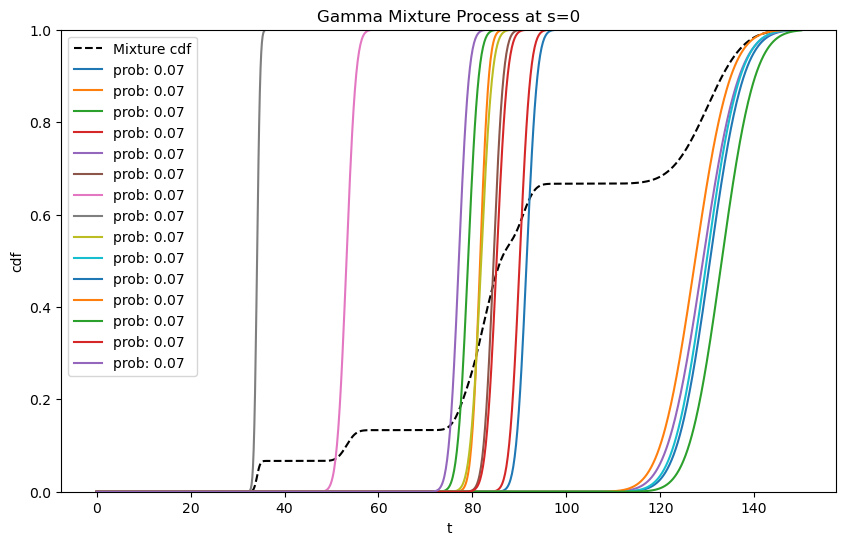

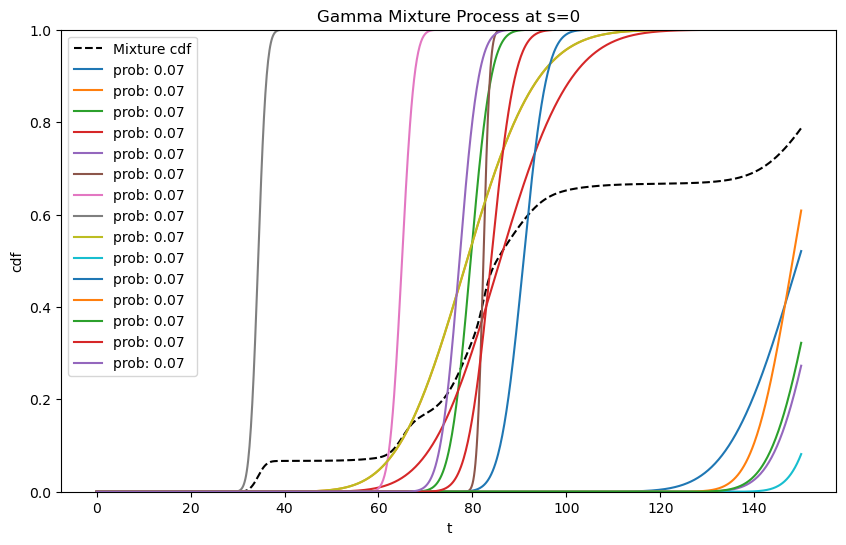

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_rv_dist(t,s=0,func='cdf',show_prob=True,show_comp=True,conf_level=0) 
    plt.show()

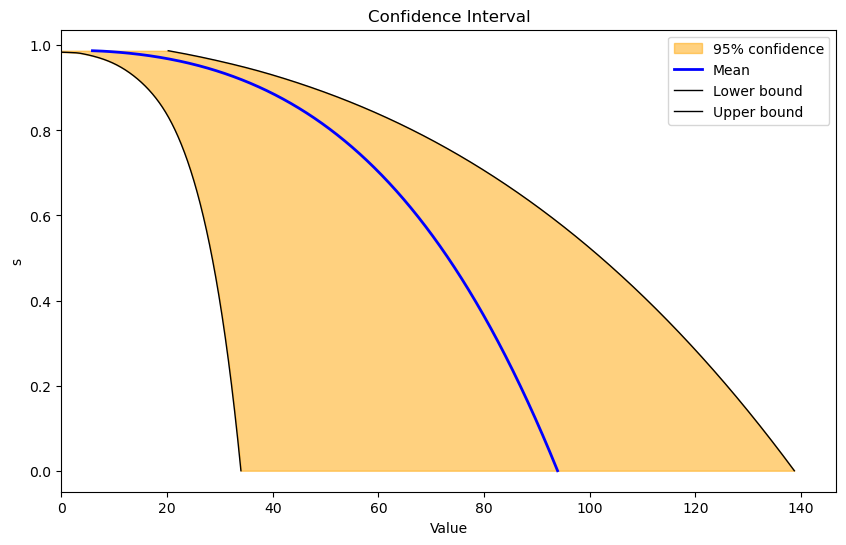

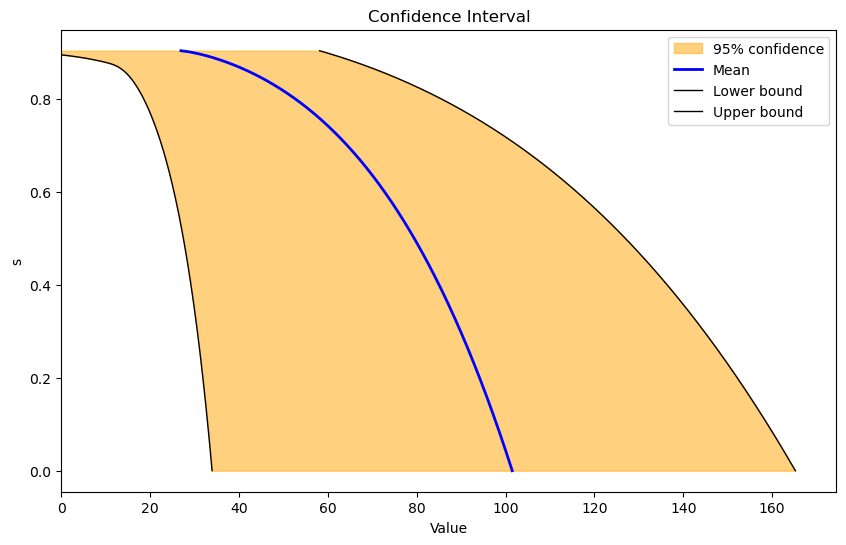

In [ ]:
level = 0.95
for name,model in gmp_dic.items():
    ax = model.plot_conf_interval(s,level=0.95)
    plt.show()

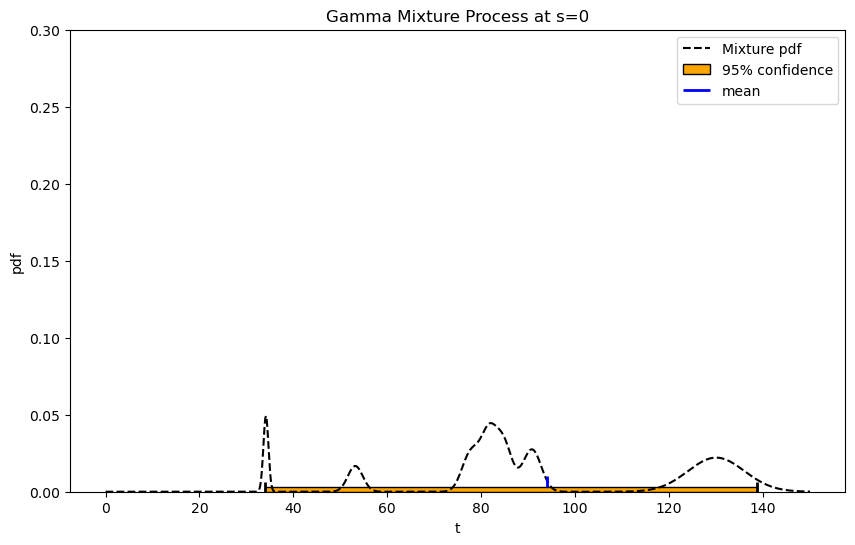

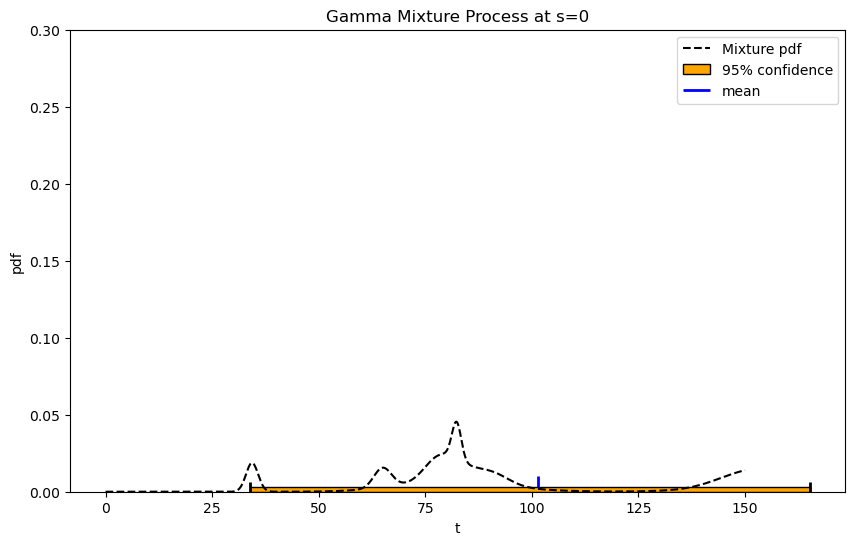

In [ ]:
for model in gmp_dic.values():
    ax=model.plot_rv_dist(t,s=0,func='pdf',show_prob=True,show_comp=False, max_prob=0.3,conf_level=0.95) 
    plt.show()

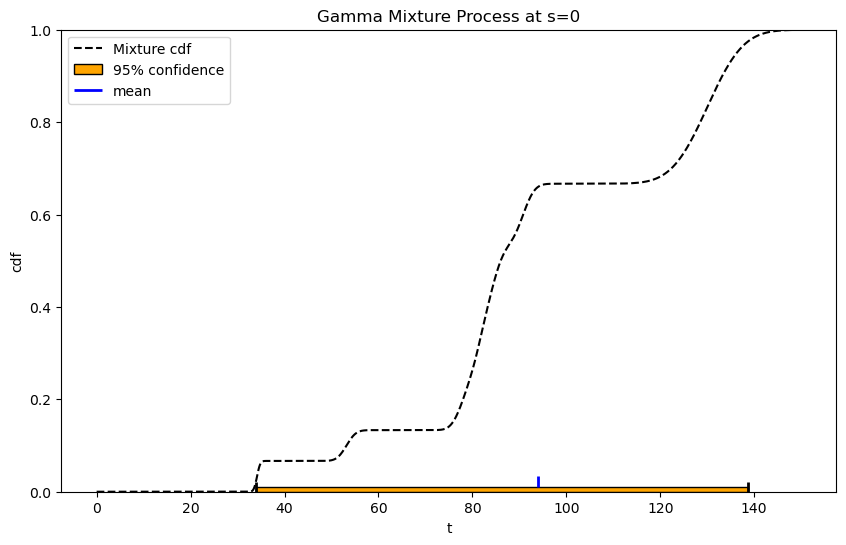

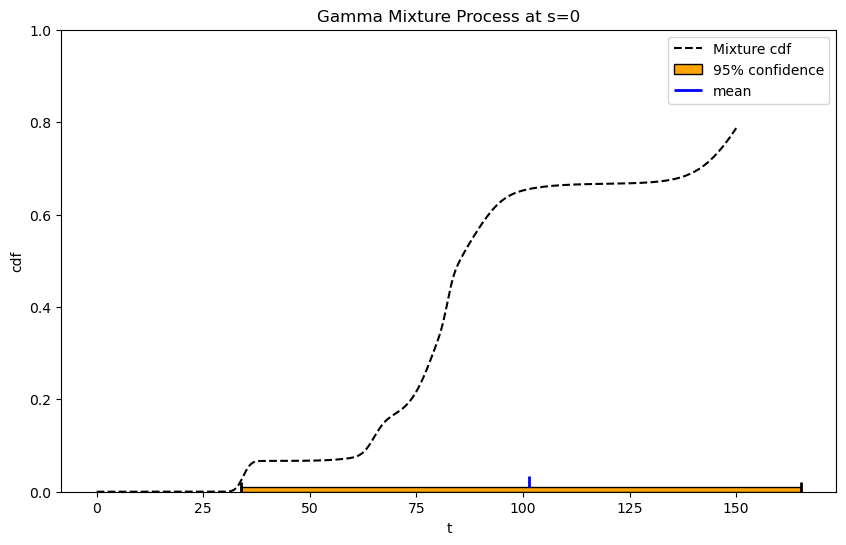

In [ ]:
for model in gmp_dic.values():
    model.plot_rv_dist(t,s=0,func='cdf',show_prob=True,show_comp=False,conf_level=0.95) 